#                                 Regresi - 1D - california_housing

# Load Data

In [9]:
import pandas as pd
from sklearn.datasets import fetch_california_housing
import os

In [10]:

file_name = "california_housing"
root_folder = f'regresi/one-d/{file_name}/' 
os.makedirs(root_folder, exist_ok=True)

data = fetch_california_housing(as_frame=True)
df = data.frame
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


#### Scaler

In [11]:
from sklearn.preprocessing import MinMaxScaler
import joblib

# Contoh: buat dan fit scaler
scaler = MinMaxScaler()
cols = [
    'MedInc', 
    'HouseAge', 
    'AveRooms',
    'AveBedrms',
    'Population', 
    'AveOccup',
    'Latitude',
    'Longitude',
    #'MedHouseVal',
]

# Dictionary untuk menyimpan hasil transformasi
scaled_data = {}

# Loop untuk setiap kolom
for col in cols:
    scaler = MinMaxScaler()
    df[[col]] = scaler.fit_transform(df[[col]])  # scaling per kolom
    joblib.dump(scaler, os.path.join(root_folder, f'scaler_{col}.pkl'))
    scaled_data[col] = scaler
    print(f"✅ Scaler for '{col}' saved as scaler_{col}.pkl")

print("\nAll individual scalers saved successfully!")

✅ Scaler for 'MedInc' saved as scaler_MedInc.pkl
✅ Scaler for 'HouseAge' saved as scaler_HouseAge.pkl
✅ Scaler for 'AveRooms' saved as scaler_AveRooms.pkl
✅ Scaler for 'AveBedrms' saved as scaler_AveBedrms.pkl
✅ Scaler for 'Population' saved as scaler_Population.pkl
✅ Scaler for 'AveOccup' saved as scaler_AveOccup.pkl
✅ Scaler for 'Latitude' saved as scaler_Latitude.pkl
✅ Scaler for 'Longitude' saved as scaler_Longitude.pkl

All individual scalers saved successfully!


In [12]:
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,0.539668,0.784314,0.043512,0.020469,0.008941,0.001499,0.567481,0.211155,4.526
1,0.538027,0.392157,0.038224,0.018929,0.067210,0.001141,0.565356,0.212151,3.585
2,0.466028,1.000000,0.052756,0.021940,0.013818,0.001698,0.564293,0.210159,3.521
3,0.354699,1.000000,0.035241,0.021929,0.015555,0.001493,0.564293,0.209163,3.413
4,0.230776,1.000000,0.038534,0.022166,0.015752,0.001198,0.564293,0.209163,3.422


#### Select Kolom To Trian

In [13]:
col_target = 'MedHouseVal'
cols = [
    'MedInc', 
    'HouseAge', 
    'AveRooms',
    'AveBedrms',
    'Population', 
    'AveOccup',
    'Latitude',
    'Longitude',
    #------------------------
    col_target
]
df = df[cols].copy()

df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,0.539668,0.784314,0.043512,0.020469,0.008941,0.001499,0.567481,0.211155,4.526
1,0.538027,0.392157,0.038224,0.018929,0.067210,0.001141,0.565356,0.212151,3.585
2,0.466028,1.000000,0.052756,0.021940,0.013818,0.001698,0.564293,0.210159,3.521
3,0.354699,1.000000,0.035241,0.021929,0.015555,0.001493,0.564293,0.209163,3.413
4,0.230776,1.000000,0.038534,0.022166,0.015752,0.001198,0.564293,0.209163,3.422


# Data Load To Train

#### select Future to traian

In [14]:
feature_cols = [
        'MedInc', 
        'HouseAge', 
        'AveRooms',
        'AveBedrms',
        'Population', 
        'AveOccup',
        'Latitude',
        'Longitude',
    ]
target_cols  = col_target

#### Split data

In [15]:
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Misal df sudah berisi semua data
# Pisahkan fitur dan target
feature_cols = feature_cols
target_cols = target_cols

# Pisahkan train-test (stratify opsional jika masih punya kolom 'diabetes_stage')
X_train, X_test = train_test_split(df, test_size=0.2, random_state=42, shuffle=True)


#### DataLoader

In [19]:
from data_set import Regression1DDataset

# Buat dataset dengan class kamu
train_dataset = Regression1DDataset(X_train, feature_cols, target_cols, normalize=False)
test_dataset  = Regression1DDataset(X_test, feature_cols, target_cols, normalize=False)

# Buat DataLoader
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=True)

# Cek contoh batch
for X, y in train_loader:
    print("X shape:", X.shape)
    print("y shape:", y.shape)
    print(X[:3])  # contoh fitur
    print(y[:3])  # contoh label
    break

X shape: torch.Size([32, 8])
y shape: torch.Size([32, 1])
tensor([[0.1513, 0.5882, 0.0284, 0.0166, 0.0332, 0.0021, 0.4527, 0.4631],
        [0.3140, 0.6863, 0.0351, 0.0205, 0.0237, 0.0014, 0.1169, 0.6424],
        [0.4722, 0.4118, 0.0470, 0.0209, 0.0458, 0.0019, 0.1318, 0.6265]])
tensor([[0.6640],
        [3.1090],
        [3.5560]])


# Config

In [18]:
from jcopdl.callback import Callback, set_config
config = set_config({
    "input_dim"      : len(test_dataset.X[0]),
    "hidden_dims"    : [24],
    "output_dim"     : len(test_dataset.y[0]),
    "dropout"        : 0.0,
    "activation"     : "relu",
    "early_stop_patience" : 10,
    "col_target"     : col_target,
    "feature_cols"   : feature_cols
})
config

Config(activation=relu, col_target=MedHouseVal, dropout=0.0, early_stop_patience=10, feature_cols=['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude'], hidden_dims=[24], input_dim=8, output_dim=1)

# MCOC

#### Model - Criterion - Optimizer - Callback

In [10]:
from class_lib import Model1DPure
from torch import optim, nn
from jcopdl.callback import Callback
import torch.optim as optim

#Model
model = Model1DPure(input_dim=config.input_dim, hidden_dims=config.hidden_dims, output_dim=config.output_dim, dropout=config.dropout, activation=config.activation).to(device)

#Criterion
criterion = nn.MSELoss()

# --- Pilihan Optimizer ---
# AdamW
optimizer_adamw = optim.AdamW(model.parameters(), lr=0.001)
# Adam
optimizer_adam = optim.Adam(model.parameters(), lr=0.001)
# SGD (Stochastic Gradient Descent)
optimizer_sgd = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
# RMSprop
optimizer_rmsprop = optim.RMSprop(model.parameters(), lr=0.001, momentum=0.9)
# Adagrad
optimizer_adagrad = optim.Adagrad(model.parameters(), lr=0.01)
# Adadelta
optimizer_adadelta = optim.Adadelta(model.parameters(), lr=0.1)
# ASGD (Averaged SGD)
optimizer_asgd = optim.ASGD(model.parameters(), lr=0.01)

# --- Contoh cara memilih salah satu ---
optim = optimizer_sgd  # misalnya kita pakai RAdam

#Callback
callback = Callback(model, config, outdir=root_folder,early_stop_patience=config.early_stop_patience)

#### Visualisasi Model

In [11]:
from visualization import plot_dynamic_multi_input_network
plot_dynamic_multi_input_network(
    input_dims=[config.input_dim],
    hidden_dims_per_branch=[
        config.hidden_dims
    ],
    combined_dims=None,
    output_dim=config.output_dim,
    figsize=(1000, 800)
)


# Training


─────────────────────────────────────────────────── 🚀 EPOCH 1 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2342.66it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 1.2595 │ 0.8807 │
│ MAE    │ 0.8738 │ 0.7426 │
│ RMSE   │ 1.1223 │ 0.9385 │
│ R2     │ 0.0578 │ 0.3279 │
└────────┴────────┴────────┘

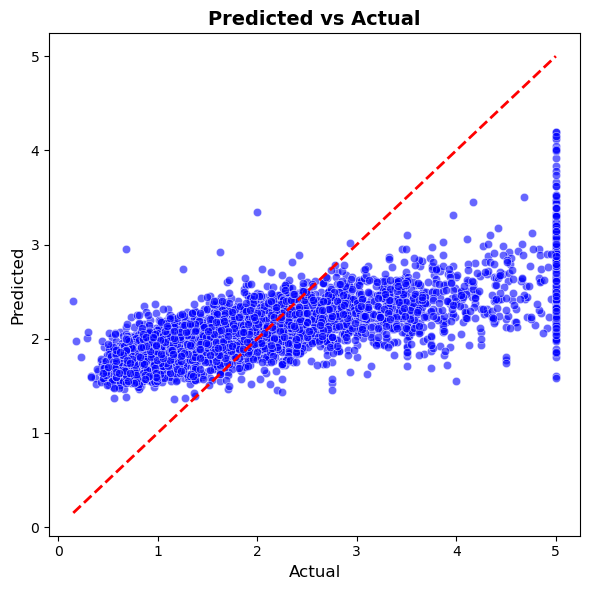


Epoch     1
Train_cost  = 1.2595 | Test_cost  = 0.8807 | Train_score = 0.0578 | Test_score = 0.3279 |


─────────────────────────────────────────────────── 🚀 EPOCH 2 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2621.81it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.7186 │ 0.6197 │
│ MAE    │ 0.6554 │ 0.6016 │
│ RMSE   │ 0.8477 │ 0.7872 │
│ R2     │ 0.4625 │ 0.5271 │
└────────┴────────┴────────┘

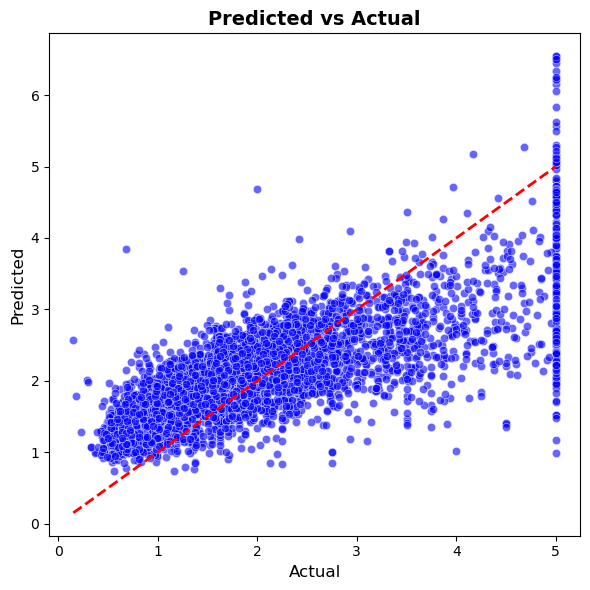


Epoch     2
Train_cost  = 0.7186 | Test_cost  = 0.6197 | Train_score = 0.4625 | Test_score = 0.5271 |


─────────────────────────────────────────────────── 🚀 EPOCH 3 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2562.06it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5849 │ 0.5830 │
│ MAE    │ 0.5676 │ 0.5629 │
│ RMSE   │ 0.7648 │ 0.7635 │
│ R2     │ 0.5625 │ 0.5551 │
└────────┴────────┴────────┘

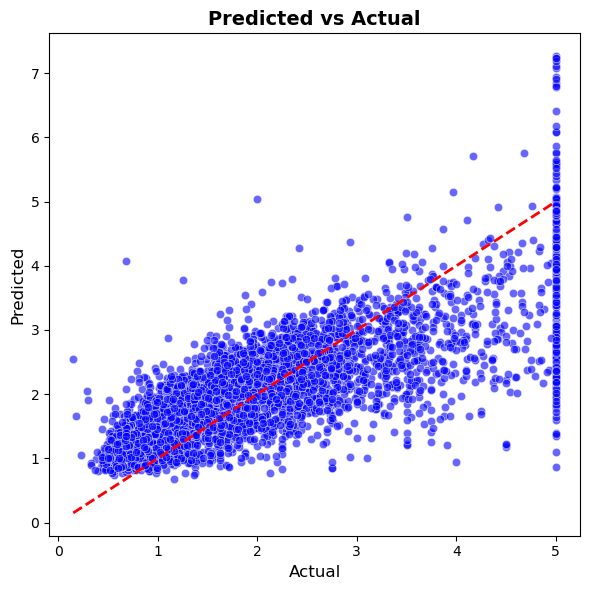


Epoch     3
Train_cost  = 0.5849 | Test_cost  = 0.5830 | Train_score = 0.5625 | Test_score = 0.5551 |


─────────────────────────────────────────────────── 🚀 EPOCH 4 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2579.63it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5645 │ 0.5694 │
│ MAE    │ 0.5506 │ 0.5464 │
│ RMSE   │ 0.7513 │ 0.7546 │
│ R2     │ 0.5777 │ 0.5655 │
└────────┴────────┴────────┘

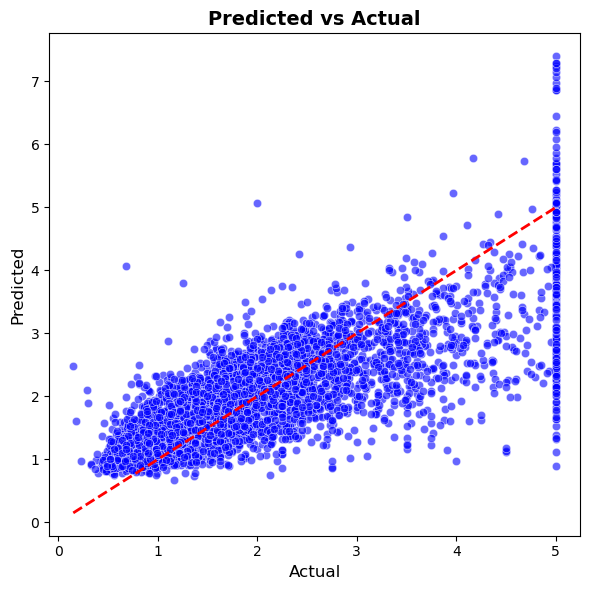


Epoch     4
Train_cost  = 0.5645 | Test_cost  = 0.5694 | Train_score = 0.5777 | Test_score = 0.5655 |


─────────────────────────────────────────────────── 🚀 EPOCH 5 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2594.66it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5513 │ 0.5591 │
│ MAE    │ 0.5430 │ 0.5468 │
│ RMSE   │ 0.7425 │ 0.7478 │
│ R2     │ 0.5876 │ 0.5733 │
└────────┴────────┴────────┘

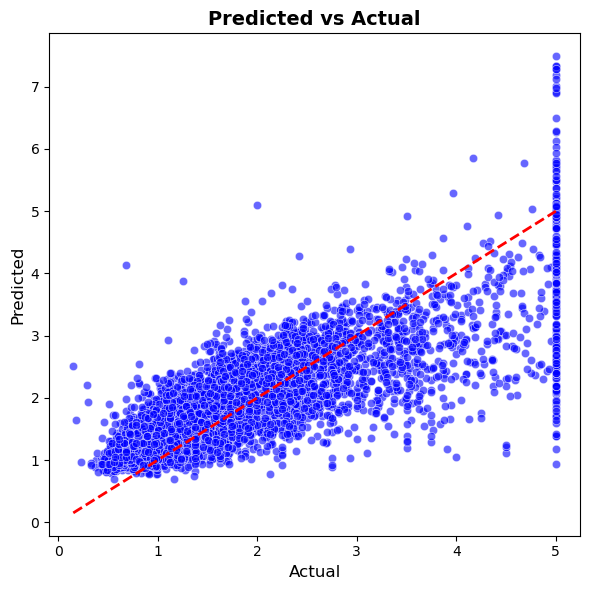


Epoch     5
Train_cost  = 0.5513 | Test_cost  = 0.5591 | Train_score = 0.5876 | Test_score = 0.5733 |


─────────────────────────────────────────────────── 🚀 EPOCH 6 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2586.08it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5427 │ 0.5493 │
│ MAE    │ 0.5368 │ 0.5364 │
│ RMSE   │ 0.7366 │ 0.7411 │
│ R2     │ 0.5941 │ 0.5809 │
└────────┴────────┴────────┘

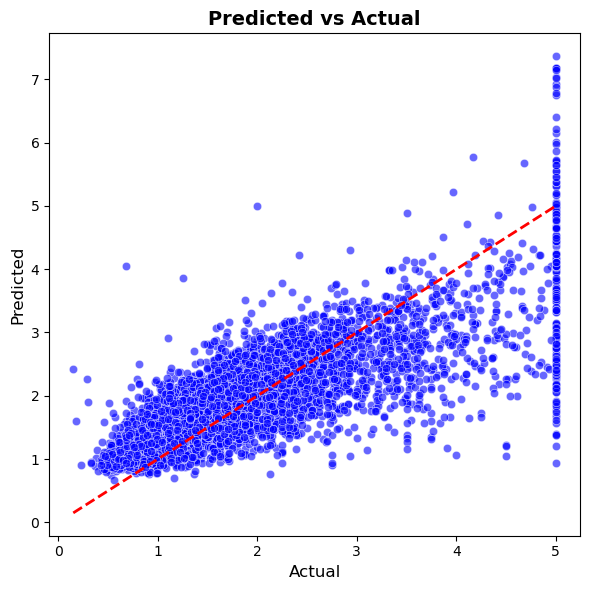


Epoch     6
Train_cost  = 0.5427 | Test_cost  = 0.5493 | Train_score = 0.5941 | Test_score = 0.5809 |


─────────────────────────────────────────────────── 🚀 EPOCH 7 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2669.87it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5336 │ 0.5420 │
│ MAE    │ 0.5320 │ 0.5278 │
│ RMSE   │ 0.7305 │ 0.7362 │
│ R2     │ 0.6008 │ 0.5864 │
└────────┴────────┴────────┘

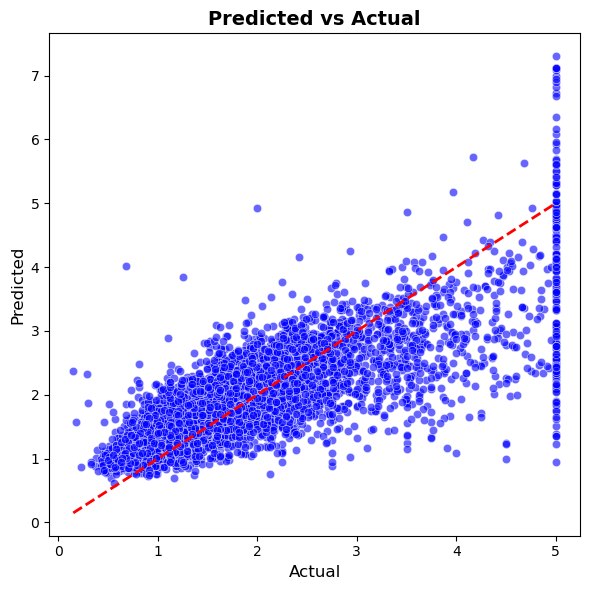


Epoch     7
Train_cost  = 0.5336 | Test_cost  = 0.5420 | Train_score = 0.6008 | Test_score = 0.5864 |


─────────────────────────────────────────────────── 🚀 EPOCH 8 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2610.51it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5282 │ 0.5354 │
│ MAE    │ 0.5286 │ 0.5238 │
│ RMSE   │ 0.7268 │ 0.7317 │
│ R2     │ 0.6049 │ 0.5914 │
└────────┴────────┴────────┘

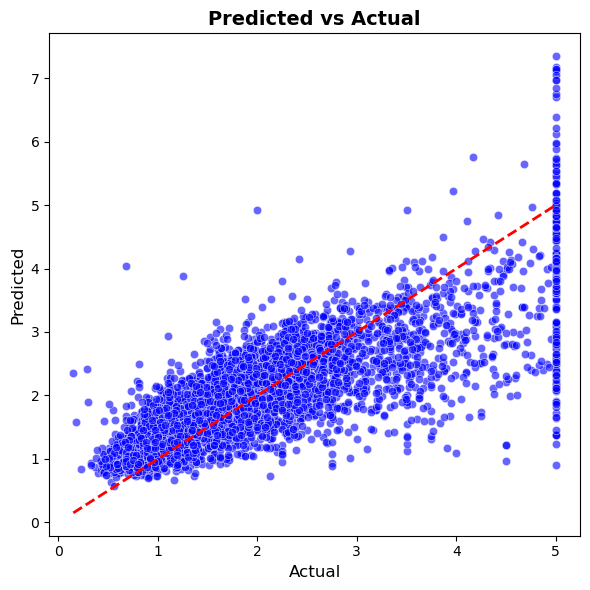


Epoch     8
Train_cost  = 0.5282 | Test_cost  = 0.5354 | Train_score = 0.6049 | Test_score = 0.5914 |


─────────────────────────────────────────────────── 🚀 EPOCH 9 ────────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2273.10it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5225 │ 0.5378 │
│ MAE    │ 0.5248 │ 0.5458 │
│ RMSE   │ 0.7228 │ 0.7333 │
│ R2     │ 0.6092 │ 0.5896 │
└────────┴────────┴────────┘

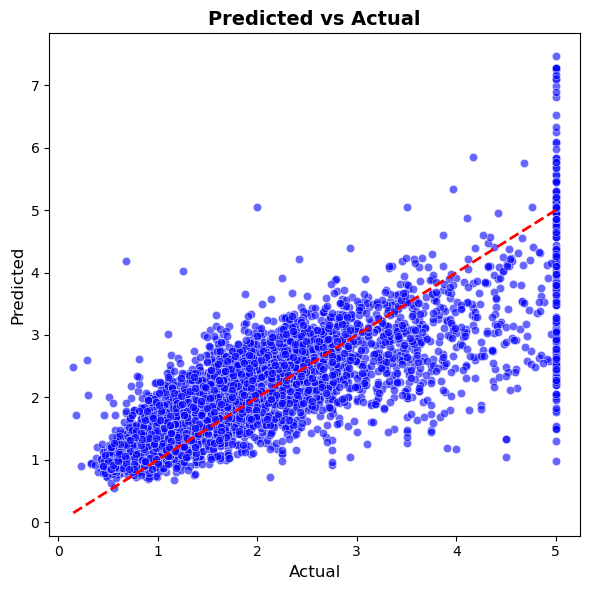


Epoch     9
Train_cost  = 0.5225 | Test_cost  = 0.5378 | Train_score = 0.6092 | Test_score = 0.5896 |
==> EarlyStop patience =  1 | Best test_score: 0.5914


─────────────────────────────────────────────────── 🚀 EPOCH 10 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2177.25it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5178 │ 0.5248 │
│ MAE    │ 0.5214 │ 0.5210 │
│ RMSE   │ 0.7196 │ 0.7245 │
│ R2     │ 0.6126 │ 0.5995 │
└────────┴────────┴────────┘

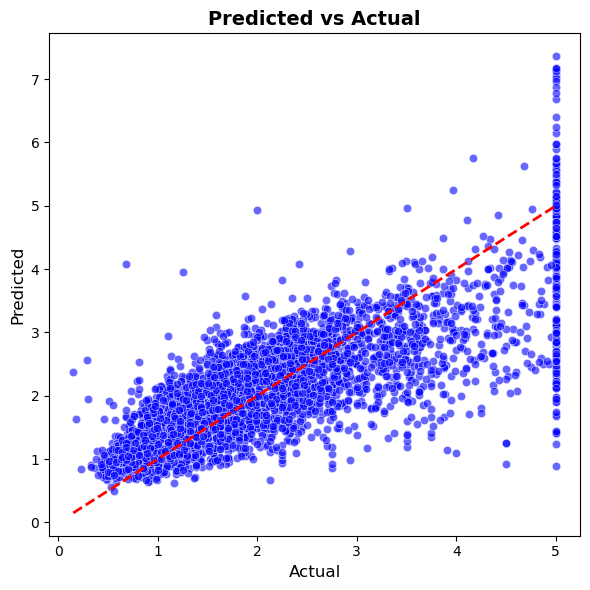


Epoch    10
Train_cost  = 0.5178 | Test_cost  = 0.5248 | Train_score = 0.6126 | Test_score = 0.5995 |


─────────────────────────────────────────────────── 🚀 EPOCH 11 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2612.82it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5141 │ 0.5217 │
│ MAE    │ 0.5190 │ 0.5217 │
│ RMSE   │ 0.7170 │ 0.7223 │
│ R2     │ 0.6154 │ 0.6019 │
└────────┴────────┴────────┘

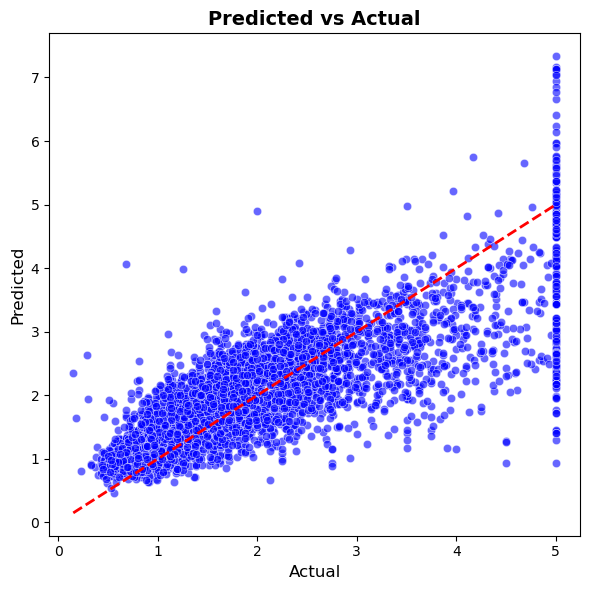


Epoch    11
Train_cost  = 0.5141 | Test_cost  = 0.5217 | Train_score = 0.6154 | Test_score = 0.6019 |


─────────────────────────────────────────────────── 🚀 EPOCH 12 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2527.82it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5090 │ 0.5202 │
│ MAE    │ 0.5164 │ 0.5067 │
│ RMSE   │ 0.7134 │ 0.7213 │
│ R2     │ 0.6192 │ 0.6030 │
└────────┴────────┴────────┘

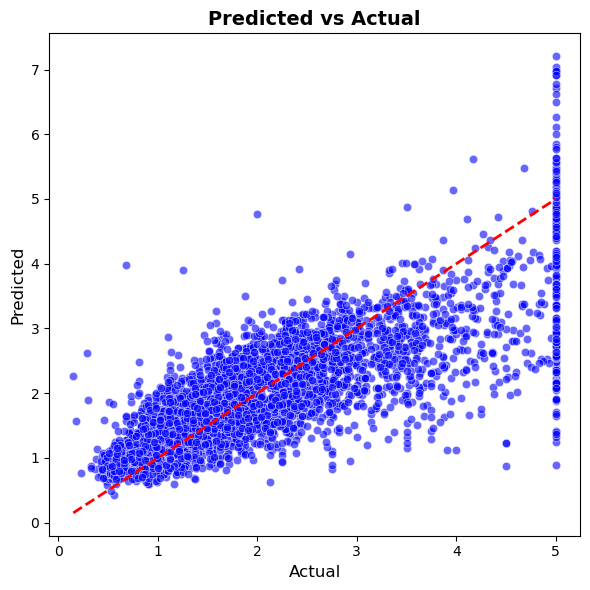


Epoch    12
Train_cost  = 0.5090 | Test_cost  = 0.5202 | Train_score = 0.6192 | Test_score = 0.6030 |


─────────────────────────────────────────────────── 🚀 EPOCH 13 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2446.40it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5071 │ 0.5188 │
│ MAE    │ 0.5140 │ 0.5285 │
│ RMSE   │ 0.7121 │ 0.7203 │
│ R2     │ 0.6206 │ 0.6041 │
└────────┴────────┴────────┘

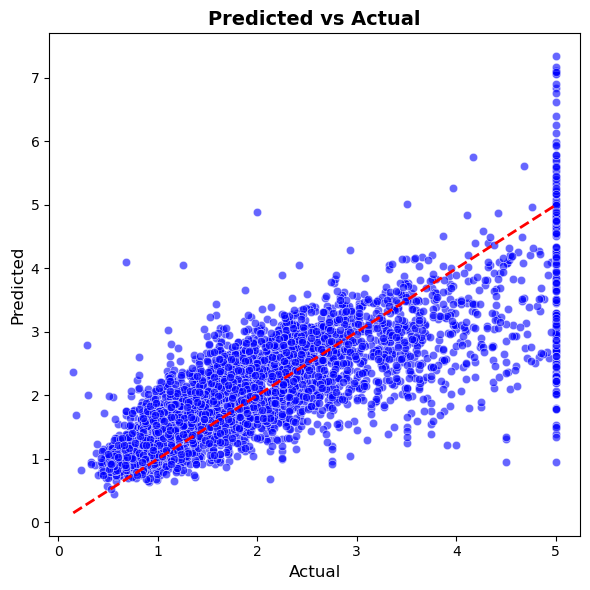


Epoch    13
Train_cost  = 0.5071 | Test_cost  = 0.5188 | Train_score = 0.6206 | Test_score = 0.6041 |


─────────────────────────────────────────────────── 🚀 EPOCH 14 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2879.02it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5056 │ 0.5130 │
│ MAE    │ 0.5132 │ 0.5056 │
│ RMSE   │ 0.7110 │ 0.7162 │
│ R2     │ 0.6218 │ 0.6085 │
└────────┴────────┴────────┘

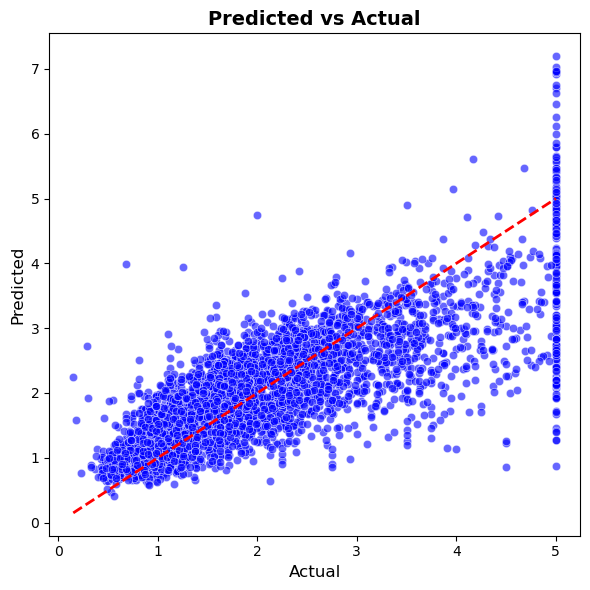


Epoch    14
Train_cost  = 0.5056 | Test_cost  = 0.5130 | Train_score = 0.6218 | Test_score = 0.6085 |


─────────────────────────────────────────────────── 🚀 EPOCH 15 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2587.64it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5036 │ 0.5159 │
│ MAE    │ 0.5119 │ 0.4998 │
│ RMSE   │ 0.7097 │ 0.7182 │
│ R2     │ 0.6232 │ 0.6063 │
└────────┴────────┴────────┘

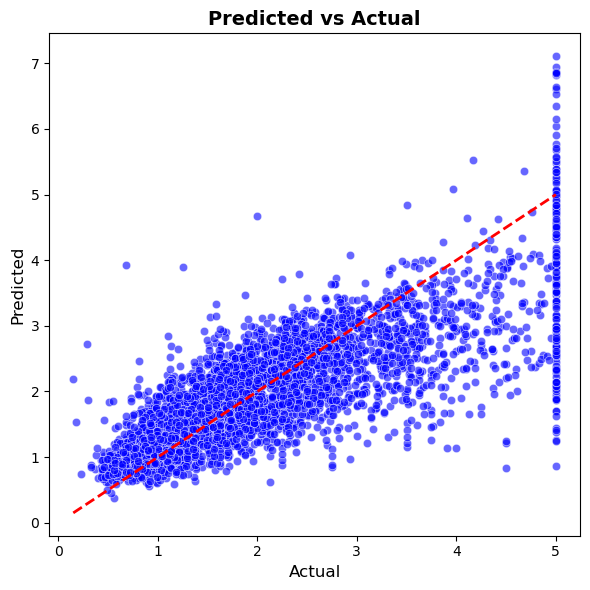


Epoch    15
Train_cost  = 0.5036 | Test_cost  = 0.5159 | Train_score = 0.6232 | Test_score = 0.6063 |
==> EarlyStop patience =  1 | Best test_score: 0.6085


─────────────────────────────────────────────────── 🚀 EPOCH 16 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2924.87it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.5005 │ 0.5086 │
│ MAE    │ 0.5095 │ 0.5147 │
│ RMSE   │ 0.7075 │ 0.7132 │
│ R2     │ 0.6256 │ 0.6119 │
└────────┴────────┴────────┘

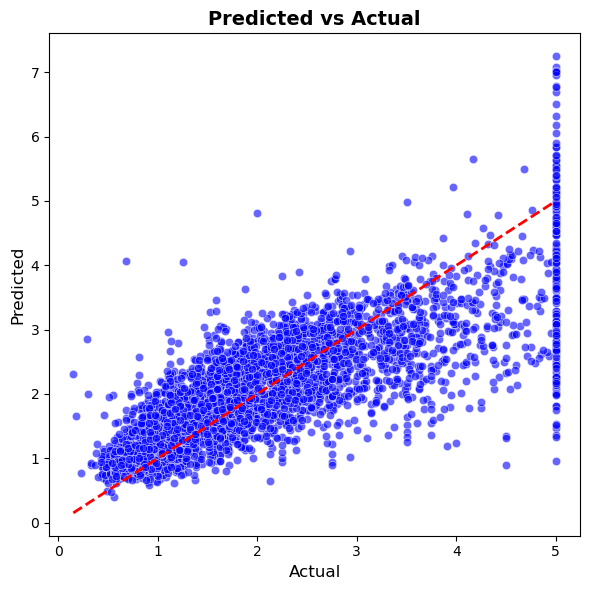


Epoch    16
Train_cost  = 0.5005 | Test_cost  = 0.5086 | Train_score = 0.6256 | Test_score = 0.6119 |


─────────────────────────────────────────────────── 🚀 EPOCH 17 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2459.49it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4987 │ 0.5074 │
│ MAE    │ 0.5084 │ 0.5037 │
│ RMSE   │ 0.7062 │ 0.7124 │
│ R2     │ 0.6269 │ 0.6128 │
└────────┴────────┴────────┘

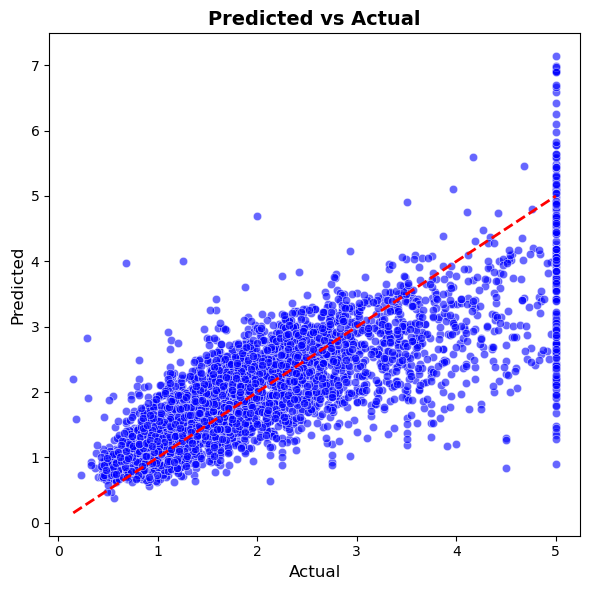


Epoch    17
Train_cost  = 0.4987 | Test_cost  = 0.5074 | Train_score = 0.6269 | Test_score = 0.6128 |


─────────────────────────────────────────────────── 🚀 EPOCH 18 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2002.24it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4985 │ 0.5050 │
│ MAE    │ 0.5074 │ 0.5091 │
│ RMSE   │ 0.7060 │ 0.7106 │
│ R2     │ 0.6271 │ 0.6147 │
└────────┴────────┴────────┘

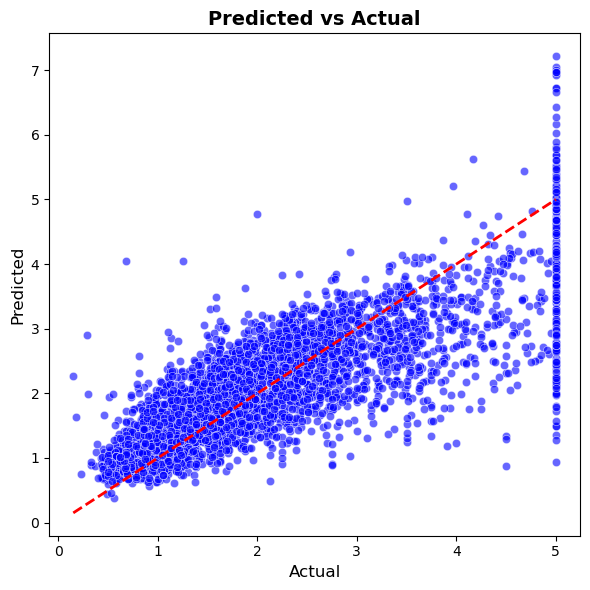


Epoch    18
Train_cost  = 0.4985 | Test_cost  = 0.5050 | Train_score = 0.6271 | Test_score = 0.6147 |


─────────────────────────────────────────────────── 🚀 EPOCH 19 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2666.57it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4961 │ 0.5059 │
│ MAE    │ 0.5064 │ 0.4990 │
│ RMSE   │ 0.7044 │ 0.7112 │
│ R2     │ 0.6289 │ 0.6140 │
└────────┴────────┴────────┘

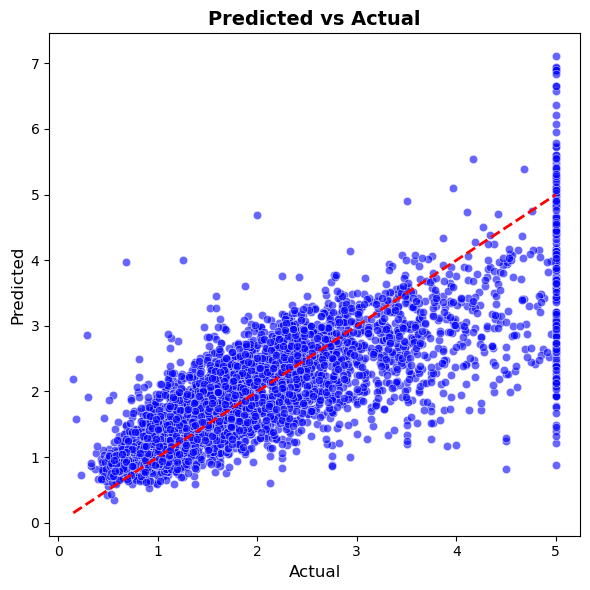


Epoch    19
Train_cost  = 0.4961 | Test_cost  = 0.5059 | Train_score = 0.6289 | Test_score = 0.6140 |
==> EarlyStop patience =  1 | Best test_score: 0.6147


─────────────────────────────────────────────────── 🚀 EPOCH 20 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2899.26it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4957 │ 0.5030 │
│ MAE    │ 0.5060 │ 0.5053 │
│ RMSE   │ 0.7040 │ 0.7092 │
│ R2     │ 0.6292 │ 0.6162 │
└────────┴────────┴────────┘

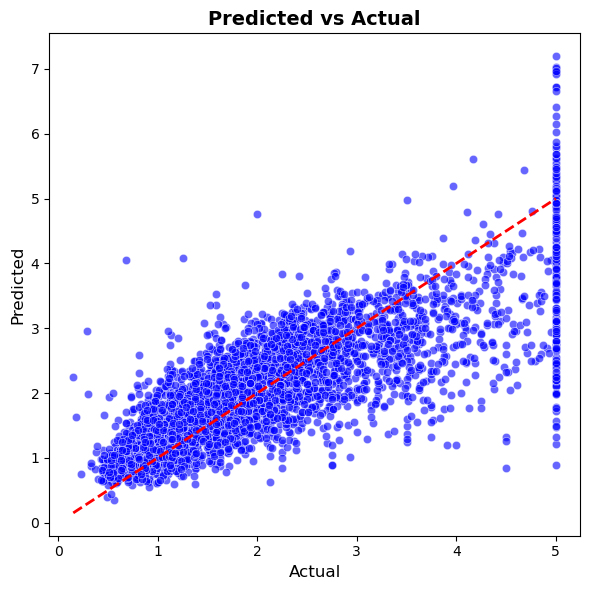


Epoch    20
Train_cost  = 0.4957 | Test_cost  = 0.5030 | Train_score = 0.6292 | Test_score = 0.6162 |


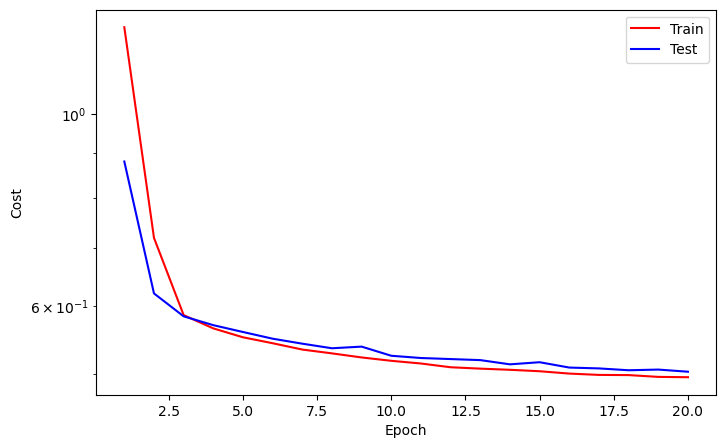

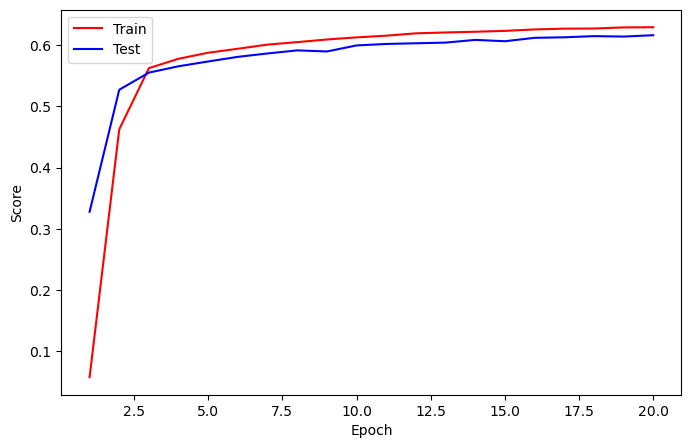

─────────────────────────────────────────────────── 🚀 EPOCH 21 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2799.31it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4944 │ 0.5014 │
│ MAE    │ 0.5050 │ 0.5038 │
│ RMSE   │ 0.7031 │ 0.7081 │
│ R2     │ 0.6302 │ 0.6174 │
└────────┴────────┴────────┘

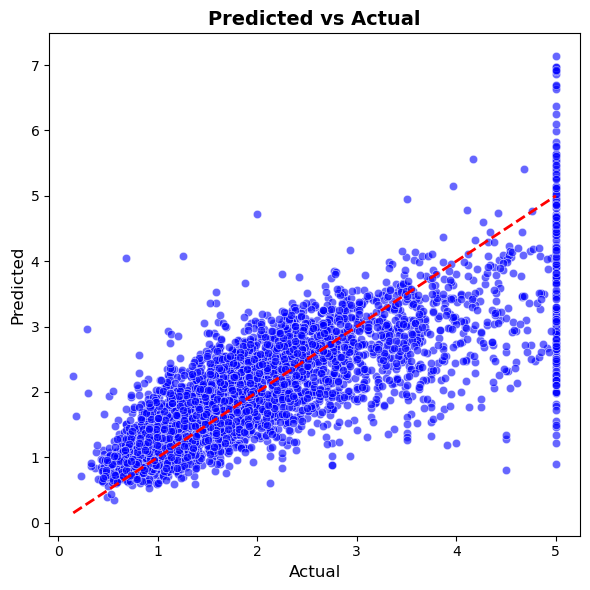


Epoch    21
Train_cost  = 0.4944 | Test_cost  = 0.5014 | Train_score = 0.6302 | Test_score = 0.6174 |


─────────────────────────────────────────────────── 🚀 EPOCH 22 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2609.27it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4938 │ 0.5057 │
│ MAE    │ 0.5050 │ 0.5190 │
│ RMSE   │ 0.7027 │ 0.7112 │
│ R2     │ 0.6306 │ 0.6141 │
└────────┴────────┴────────┘

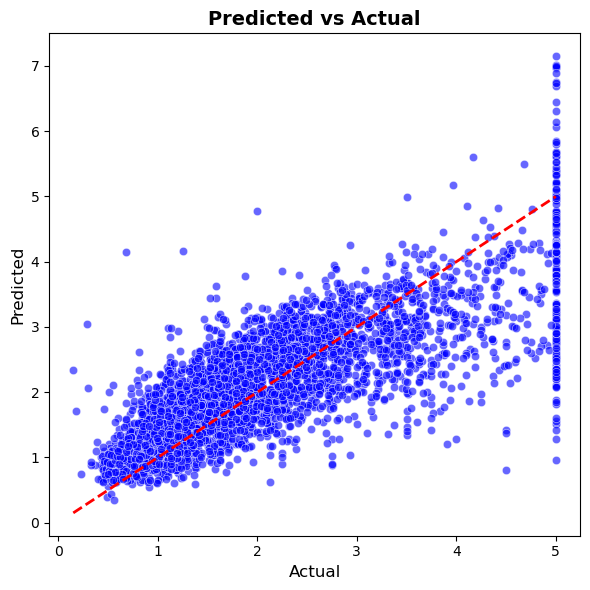


Epoch    22
Train_cost  = 0.4938 | Test_cost  = 0.5057 | Train_score = 0.6306 | Test_score = 0.6141 |
==> EarlyStop patience =  1 | Best test_score: 0.6174


─────────────────────────────────────────────────── 🚀 EPOCH 23 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2589.14it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4931 │ 0.5017 │
│ MAE    │ 0.5042 │ 0.4967 │
│ RMSE   │ 0.7022 │ 0.7083 │
│ R2     │ 0.6311 │ 0.6172 │
└────────┴────────┴────────┘

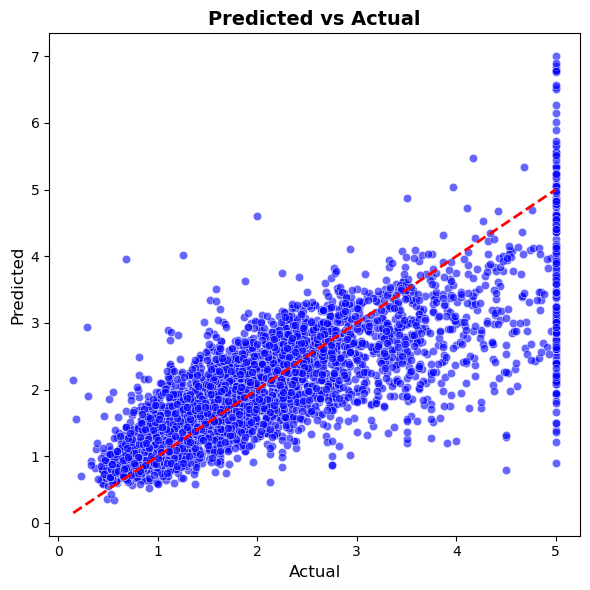


Epoch    23
Train_cost  = 0.4931 | Test_cost  = 0.5017 | Train_score = 0.6311 | Test_score = 0.6172 |
==> EarlyStop patience =  2 | Best test_score: 0.6174


─────────────────────────────────────────────────── 🚀 EPOCH 24 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2806.03it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4918 │ 0.5029 │
│ MAE    │ 0.5031 │ 0.5150 │
│ RMSE   │ 0.7013 │ 0.7092 │
│ R2     │ 0.6321 │ 0.6162 │
└────────┴────────┴────────┘

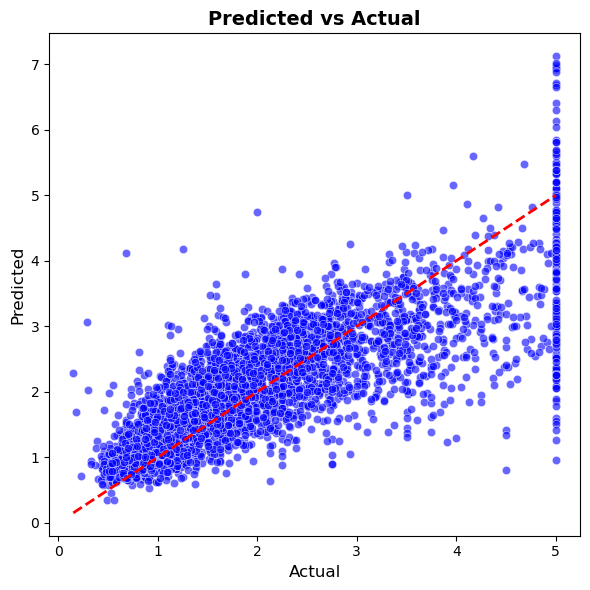


Epoch    24
Train_cost  = 0.4918 | Test_cost  = 0.5029 | Train_score = 0.6321 | Test_score = 0.6162 |
==> EarlyStop patience =  3 | Best test_score: 0.6174


─────────────────────────────────────────────────── 🚀 EPOCH 25 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2920.52it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4923 │ 0.4988 │
│ MAE    │ 0.5034 │ 0.5005 │
│ RMSE   │ 0.7016 │ 0.7062 │
│ R2     │ 0.6317 │ 0.6194 │
└────────┴────────┴────────┘

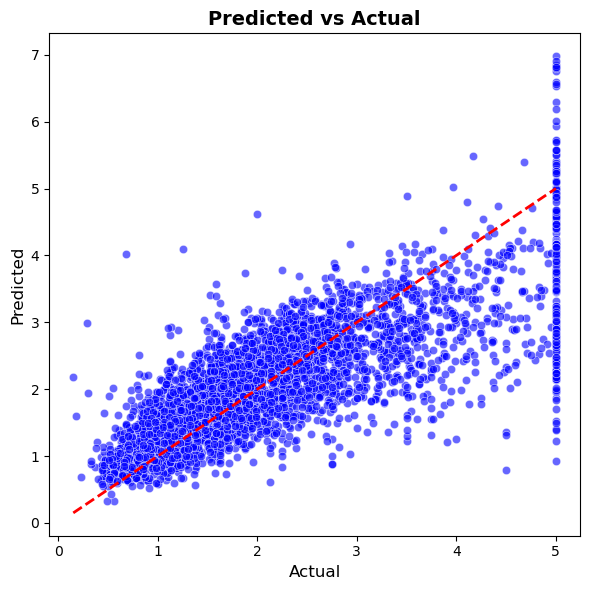


Epoch    25
Train_cost  = 0.4923 | Test_cost  = 0.4988 | Train_score = 0.6317 | Test_score = 0.6194 |


─────────────────────────────────────────────────── 🚀 EPOCH 26 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2599.06it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4901 │ 0.4984 │
│ MAE    │ 0.5027 │ 0.5093 │
│ RMSE   │ 0.7001 │ 0.7060 │
│ R2     │ 0.6333 │ 0.6196 │
└────────┴────────┴────────┘

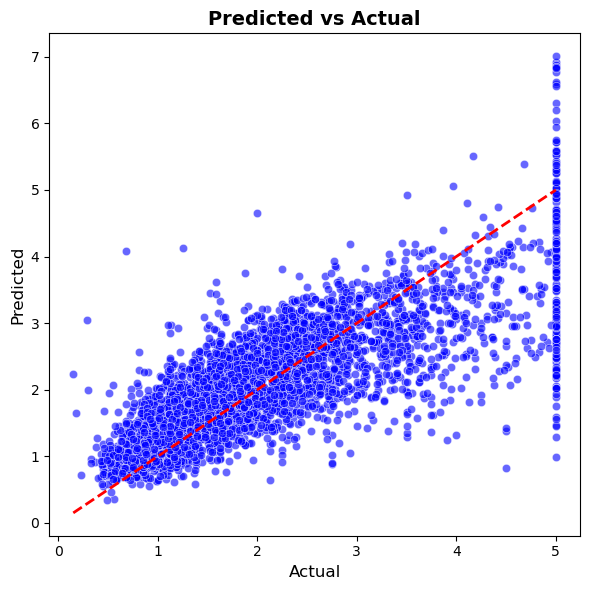


Epoch    26
Train_cost  = 0.4901 | Test_cost  = 0.4984 | Train_score = 0.6333 | Test_score = 0.6196 |


─────────────────────────────────────────────────── 🚀 EPOCH 27 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2588.42it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4898 │ 0.4985 │
│ MAE    │ 0.5019 │ 0.4952 │
│ RMSE   │ 0.6998 │ 0.7060 │
│ R2     │ 0.6336 │ 0.6196 │
└────────┴────────┴────────┘

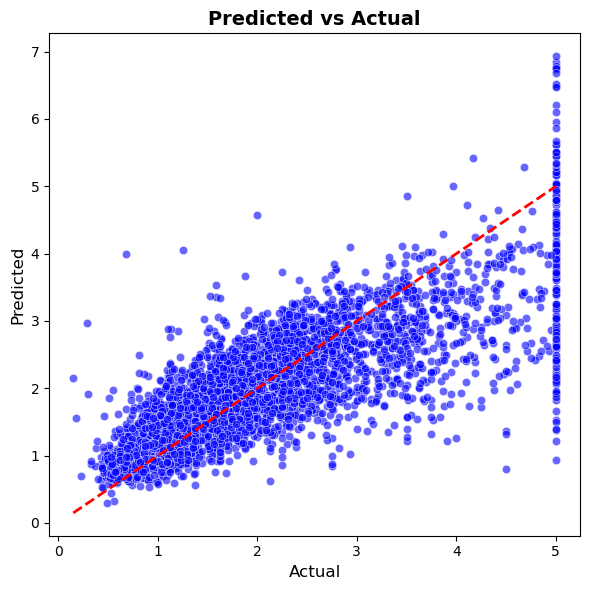


Epoch    27
Train_cost  = 0.4898 | Test_cost  = 0.4985 | Train_score = 0.6336 | Test_score = 0.6196 |
==> EarlyStop patience =  1 | Best test_score: 0.6196


─────────────────────────────────────────────────── 🚀 EPOCH 28 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2629.82it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4898 │ 0.4965 │
│ MAE    │ 0.5022 │ 0.4988 │
│ RMSE   │ 0.6998 │ 0.7046 │
│ R2     │ 0.6336 │ 0.6211 │
└────────┴────────┴────────┘

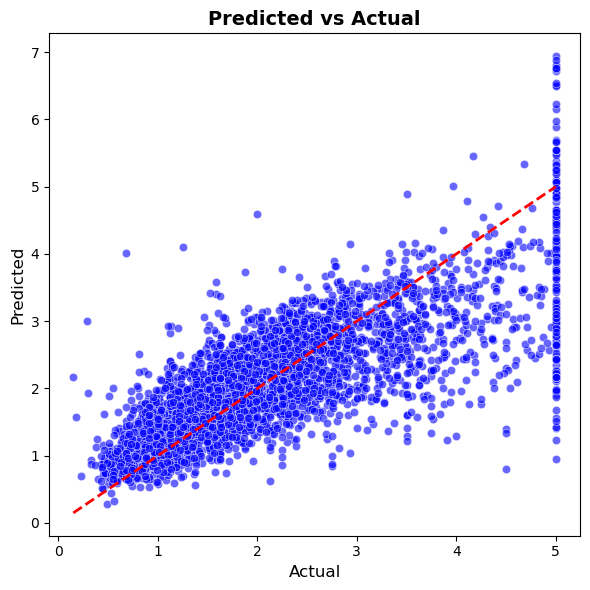


Epoch    28
Train_cost  = 0.4898 | Test_cost  = 0.4965 | Train_score = 0.6336 | Test_score = 0.6211 |


─────────────────────────────────────────────────── 🚀 EPOCH 29 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2804.96it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4889 │ 0.4950 │
│ MAE    │ 0.5010 │ 0.4998 │
│ RMSE   │ 0.6992 │ 0.7036 │
│ R2     │ 0.6342 │ 0.6223 │
└────────┴────────┴────────┘

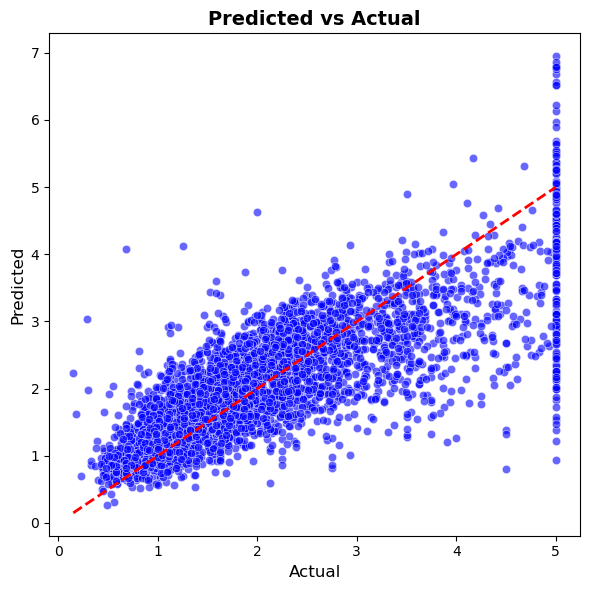


Epoch    29
Train_cost  = 0.4889 | Test_cost  = 0.4950 | Train_score = 0.6342 | Test_score = 0.6223 |


─────────────────────────────────────────────────── 🚀 EPOCH 30 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2687.44it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4878 │ 0.4956 │
│ MAE    │ 0.5006 │ 0.5078 │
│ RMSE   │ 0.6984 │ 0.7040 │
│ R2     │ 0.6351 │ 0.6218 │
└────────┴────────┴────────┘

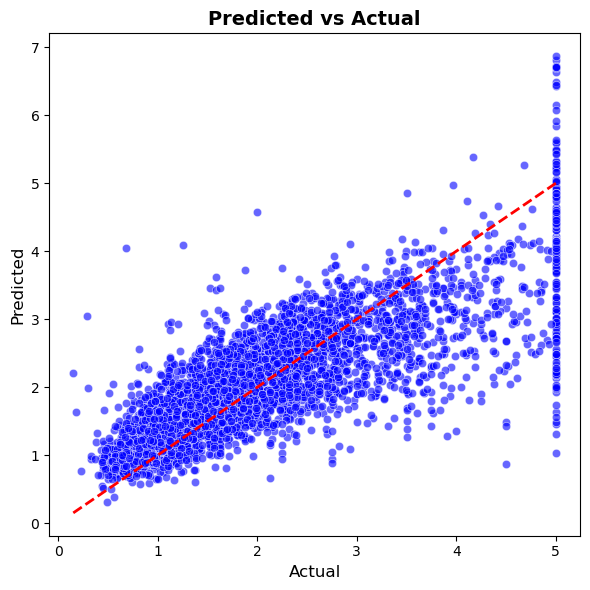


Epoch    30
Train_cost  = 0.4878 | Test_cost  = 0.4956 | Train_score = 0.6351 | Test_score = 0.6218 |
==> EarlyStop patience =  1 | Best test_score: 0.6223


─────────────────────────────────────────────────── 🚀 EPOCH 31 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2708.96it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4873 │ 0.5019 │
│ MAE    │ 0.5011 │ 0.4887 │
│ RMSE   │ 0.6980 │ 0.7084 │
│ R2     │ 0.6355 │ 0.6170 │
└────────┴────────┴────────┘

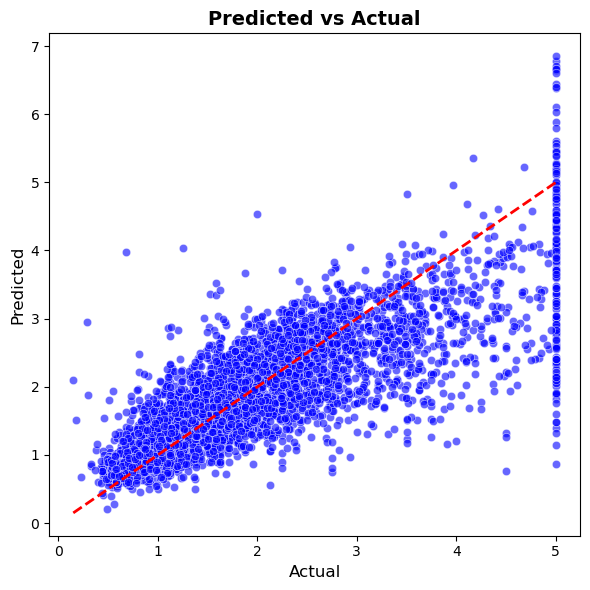


Epoch    31
Train_cost  = 0.4873 | Test_cost  = 0.5019 | Train_score = 0.6355 | Test_score = 0.6170 |
==> EarlyStop patience =  2 | Best test_score: 0.6223


─────────────────────────────────────────────────── 🚀 EPOCH 32 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2523.11it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4870 │ 0.4952 │
│ MAE    │ 0.5004 │ 0.4932 │
│ RMSE   │ 0.6979 │ 0.7037 │
│ R2     │ 0.6357 │ 0.6221 │
└────────┴────────┴────────┘

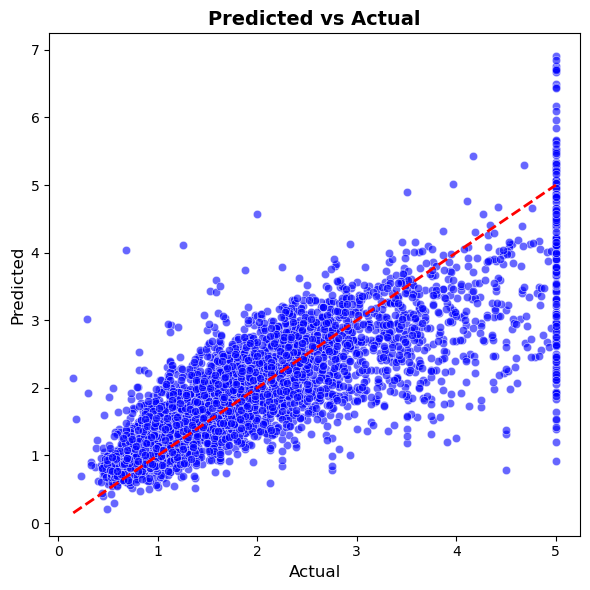


Epoch    32
Train_cost  = 0.4870 | Test_cost  = 0.4952 | Train_score = 0.6357 | Test_score = 0.6221 |
==> EarlyStop patience =  3 | Best test_score: 0.6223


─────────────────────────────────────────────────── 🚀 EPOCH 33 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2836.78it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4864 │ 0.4998 │
│ MAE    │ 0.4997 │ 0.5168 │
│ RMSE   │ 0.6974 │ 0.7070 │
│ R2     │ 0.6361 │ 0.6186 │
└────────┴────────┴────────┘

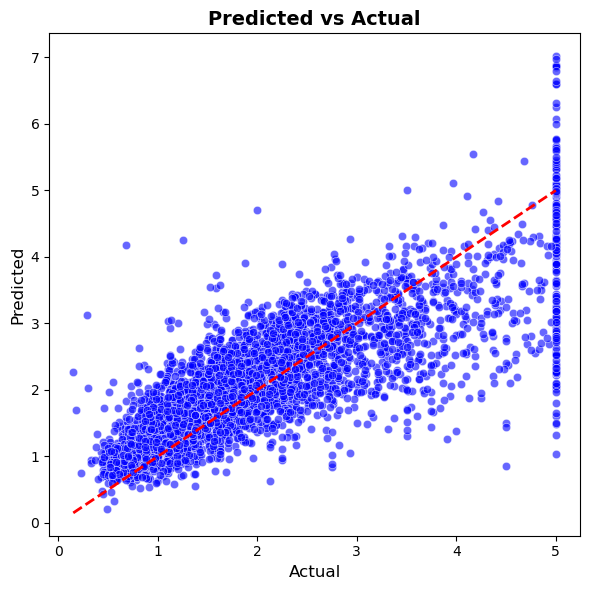


Epoch    33
Train_cost  = 0.4864 | Test_cost  = 0.4998 | Train_score = 0.6361 | Test_score = 0.6186 |
==> EarlyStop patience =  4 | Best test_score: 0.6223


─────────────────────────────────────────────────── 🚀 EPOCH 34 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2766.78it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4850 │ 0.5014 │
│ MAE    │ 0.4993 │ 0.4877 │
│ RMSE   │ 0.6964 │ 0.7081 │
│ R2     │ 0.6372 │ 0.6174 │
└────────┴────────┴────────┘

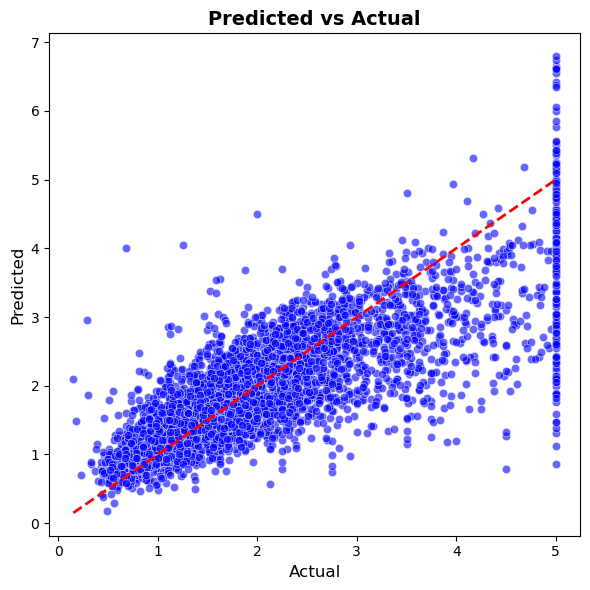


Epoch    34
Train_cost  = 0.4850 | Test_cost  = 0.5014 | Train_score = 0.6372 | Test_score = 0.6174 |
==> EarlyStop patience =  5 | Best test_score: 0.6223


─────────────────────────────────────────────────── 🚀 EPOCH 35 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2798.23it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4856 │ 0.4930 │
│ MAE    │ 0.4996 │ 0.4927 │
│ RMSE   │ 0.6969 │ 0.7021 │
│ R2     │ 0.6367 │ 0.6238 │
└────────┴────────┴────────┘

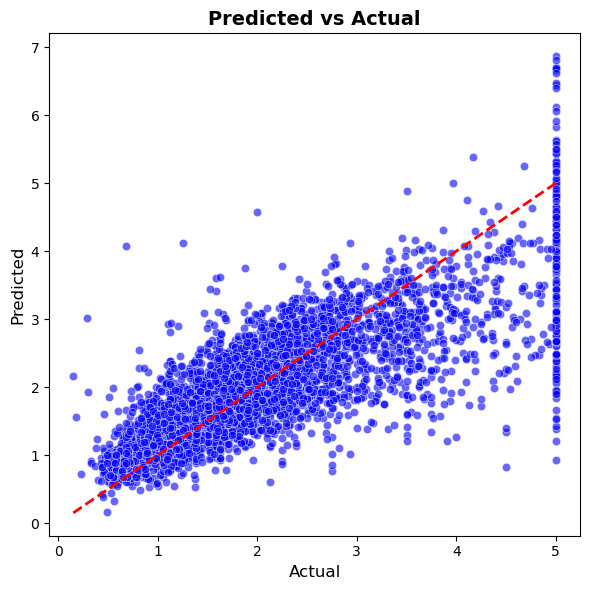


Epoch    35
Train_cost  = 0.4856 | Test_cost  = 0.4930 | Train_score = 0.6367 | Test_score = 0.6238 |


─────────────────────────────────────────────────── 🚀 EPOCH 36 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2886.71it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4839 │ 0.4955 │
│ MAE    │ 0.4987 │ 0.5078 │
│ RMSE   │ 0.6956 │ 0.7039 │
│ R2     │ 0.6380 │ 0.6219 │
└────────┴────────┴────────┘

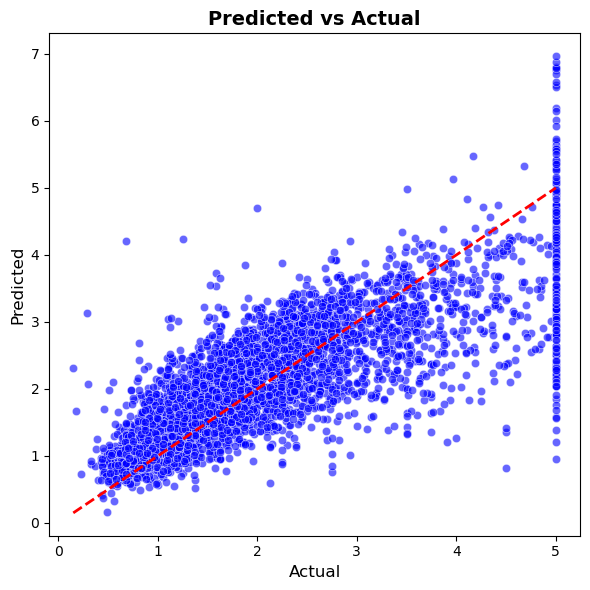


Epoch    36
Train_cost  = 0.4839 | Test_cost  = 0.4955 | Train_score = 0.6380 | Test_score = 0.6219 |
==> EarlyStop patience =  1 | Best test_score: 0.6238


─────────────────────────────────────────────────── 🚀 EPOCH 37 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2693.50it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4848 │ 0.4918 │
│ MAE    │ 0.4986 │ 0.4969 │
│ RMSE   │ 0.6963 │ 0.7013 │
│ R2     │ 0.6373 │ 0.6247 │
└────────┴────────┴────────┘

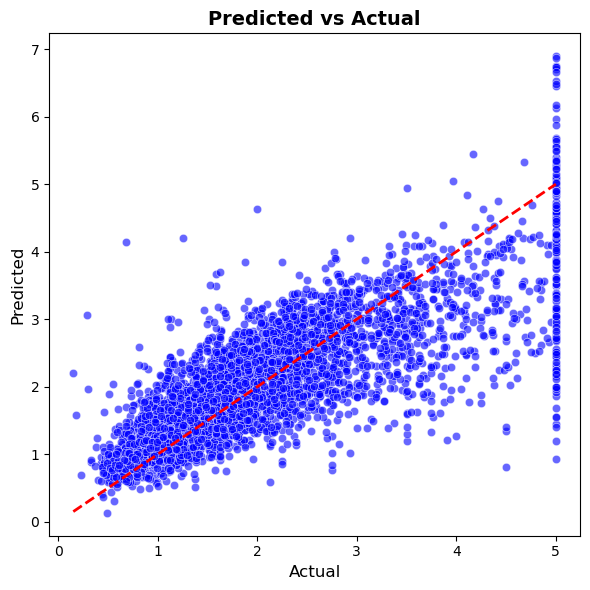


Epoch    37
Train_cost  = 0.4848 | Test_cost  = 0.4918 | Train_score = 0.6373 | Test_score = 0.6247 |


─────────────────────────────────────────────────── 🚀 EPOCH 38 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2649.81it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4833 │ 0.4960 │
│ MAE    │ 0.4979 │ 0.5110 │
│ RMSE   │ 0.6952 │ 0.7043 │
│ R2     │ 0.6385 │ 0.6215 │
└────────┴────────┴────────┘

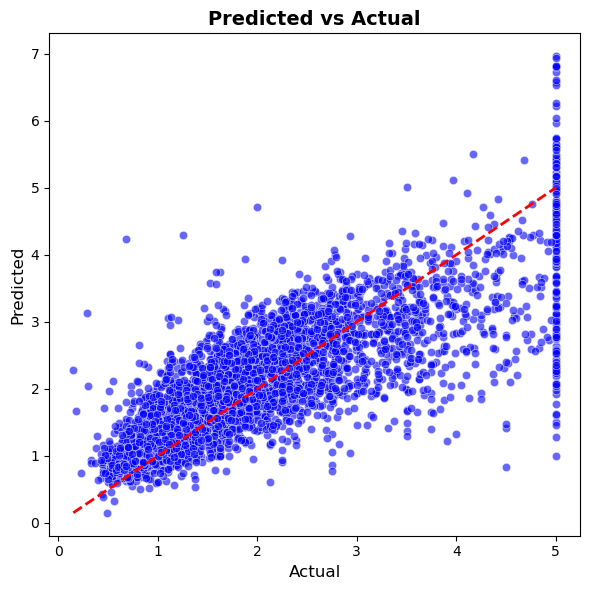


Epoch    38
Train_cost  = 0.4833 | Test_cost  = 0.4960 | Train_score = 0.6385 | Test_score = 0.6215 |
==> EarlyStop patience =  1 | Best test_score: 0.6247


─────────────────────────────────────────────────── 🚀 EPOCH 39 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2869.47it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4839 │ 0.4923 │
│ MAE    │ 0.4976 │ 0.5074 │
│ RMSE   │ 0.6956 │ 0.7016 │
│ R2     │ 0.6380 │ 0.6243 │
└────────┴────────┴────────┘

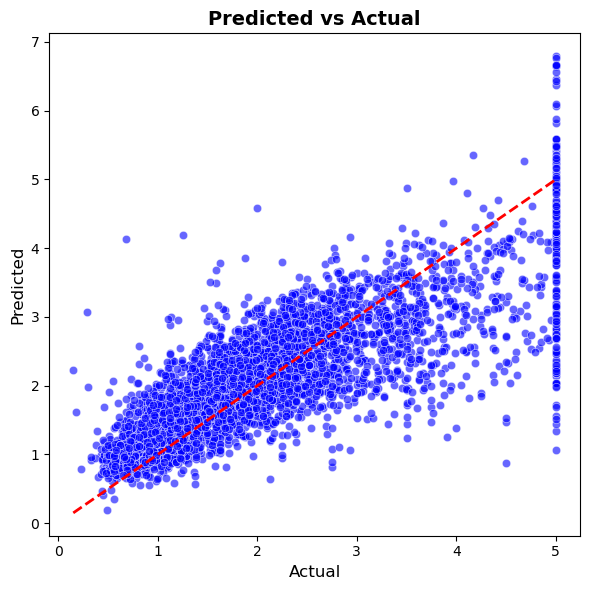


Epoch    39
Train_cost  = 0.4839 | Test_cost  = 0.4923 | Train_score = 0.6380 | Test_score = 0.6243 |
==> EarlyStop patience =  2 | Best test_score: 0.6247


─────────────────────────────────────────────────── 🚀 EPOCH 40 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2860.39it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4818 │ 0.4987 │
│ MAE    │ 0.4970 │ 0.4850 │
│ RMSE   │ 0.6941 │ 0.7062 │
│ R2     │ 0.6396 │ 0.6194 │
└────────┴────────┴────────┘

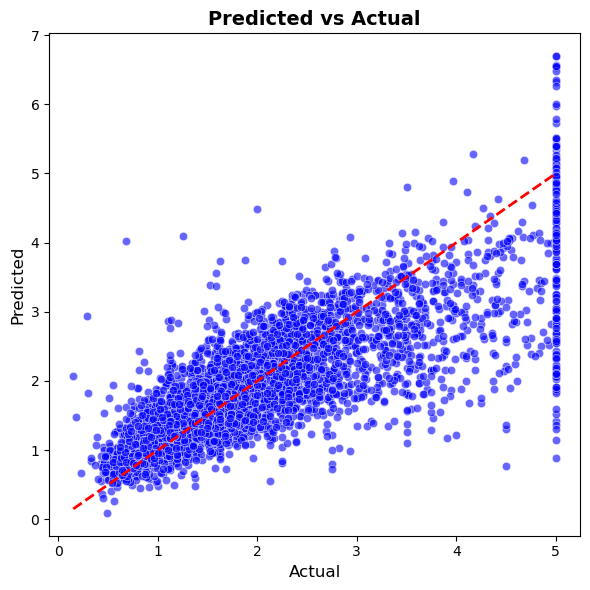


Epoch    40
Train_cost  = 0.4818 | Test_cost  = 0.4987 | Train_score = 0.6396 | Test_score = 0.6194 |


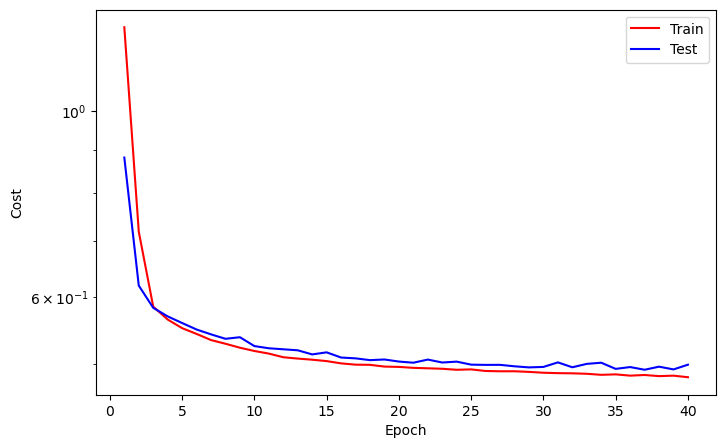

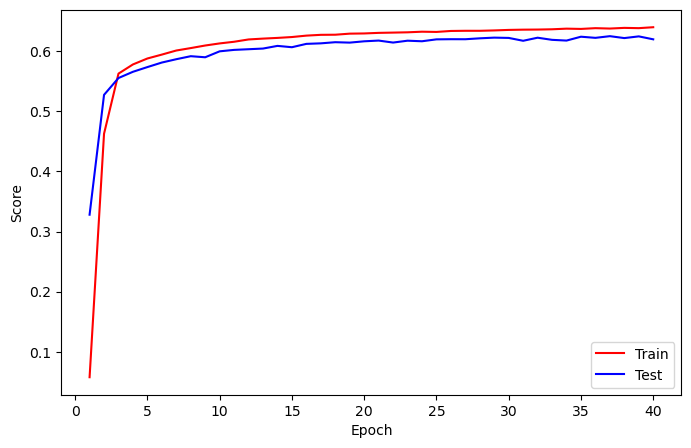

==> EarlyStop patience =  3 | Best test_score: 0.6247


─────────────────────────────────────────────────── 🚀 EPOCH 41 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2916.95it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4821 │ 0.4891 │
│ MAE    │ 0.4965 │ 0.4958 │
│ RMSE   │ 0.6943 │ 0.6994 │
│ R2     │ 0.6394 │ 0.6268 │
└────────┴────────┴────────┘

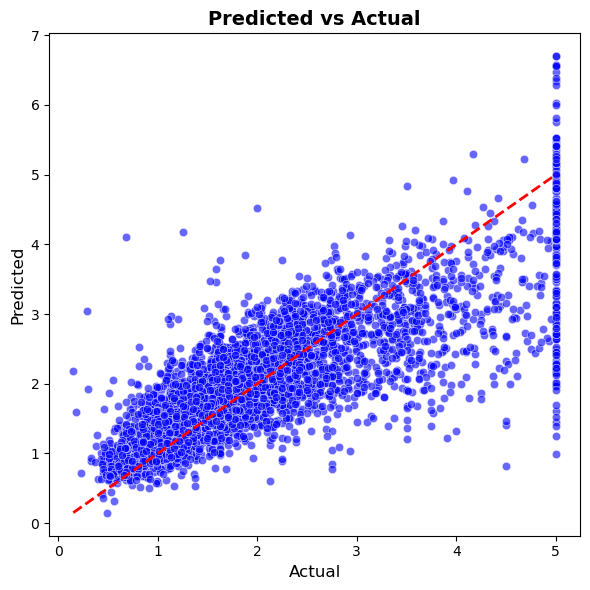


Epoch    41
Train_cost  = 0.4821 | Test_cost  = 0.4891 | Train_score = 0.6394 | Test_score = 0.6268 |


─────────────────────────────────────────────────── 🚀 EPOCH 42 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2917.66it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4820 │ 0.4919 │
│ MAE    │ 0.4961 │ 0.5084 │
│ RMSE   │ 0.6942 │ 0.7013 │
│ R2     │ 0.6394 │ 0.6246 │
└────────┴────────┴────────┘

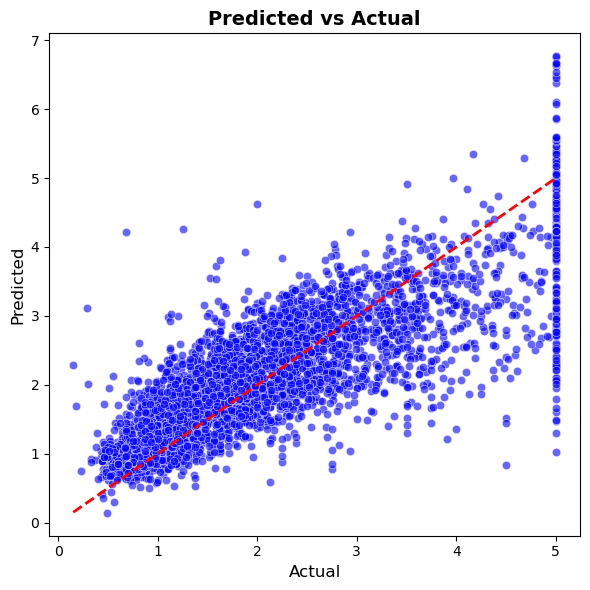


Epoch    42
Train_cost  = 0.4820 | Test_cost  = 0.4919 | Train_score = 0.6394 | Test_score = 0.6246 |
==> EarlyStop patience =  1 | Best test_score: 0.6268


─────────────────────────────────────────────────── 🚀 EPOCH 43 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2932.36it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4802 │ 0.4964 │
│ MAE    │ 0.4960 │ 0.5169 │
│ RMSE   │ 0.6930 │ 0.7046 │
│ R2     │ 0.6408 │ 0.6212 │
└────────┴────────┴────────┘

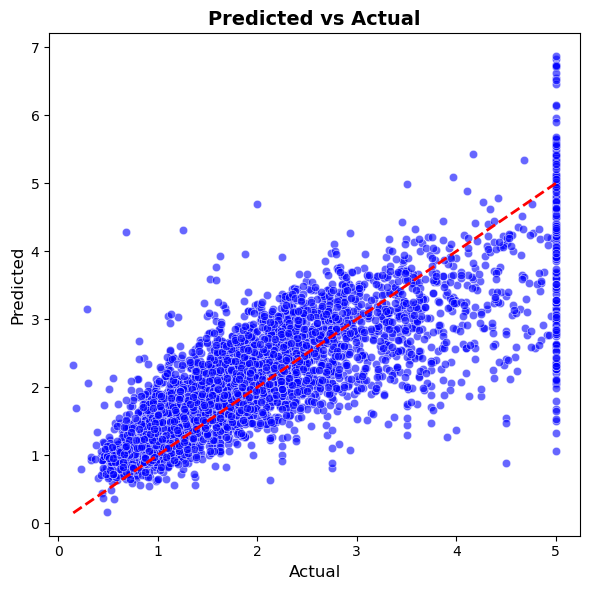


Epoch    43
Train_cost  = 0.4802 | Test_cost  = 0.4964 | Train_score = 0.6408 | Test_score = 0.6212 |
==> EarlyStop patience =  2 | Best test_score: 0.6268


─────────────────────────────────────────────────── 🚀 EPOCH 44 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2853.52it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4802 │ 0.4918 │
│ MAE    │ 0.4959 │ 0.4856 │
│ RMSE   │ 0.6929 │ 0.7013 │
│ R2     │ 0.6408 │ 0.6247 │
└────────┴────────┴────────┘

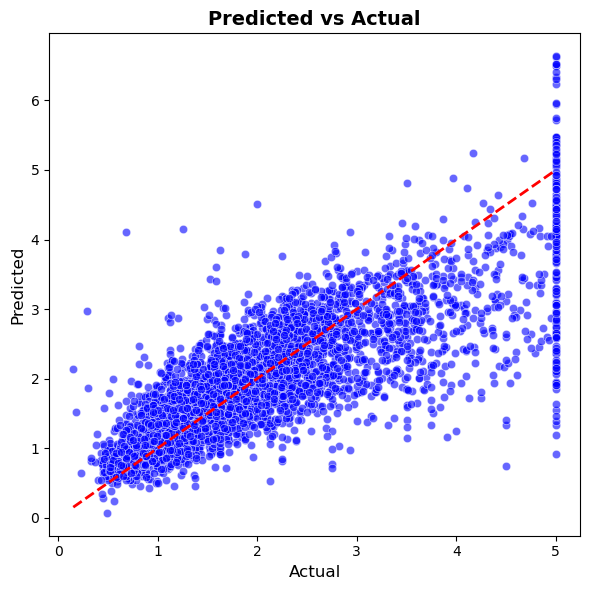


Epoch    44
Train_cost  = 0.4802 | Test_cost  = 0.4918 | Train_score = 0.6408 | Test_score = 0.6247 |
==> EarlyStop patience =  3 | Best test_score: 0.6268


─────────────────────────────────────────────────── 🚀 EPOCH 45 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2508.67it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4790 │ 0.4867 │
│ MAE    │ 0.4946 │ 0.4927 │
│ RMSE   │ 0.6921 │ 0.6976 │
│ R2     │ 0.6417 │ 0.6286 │
└────────┴────────┴────────┘

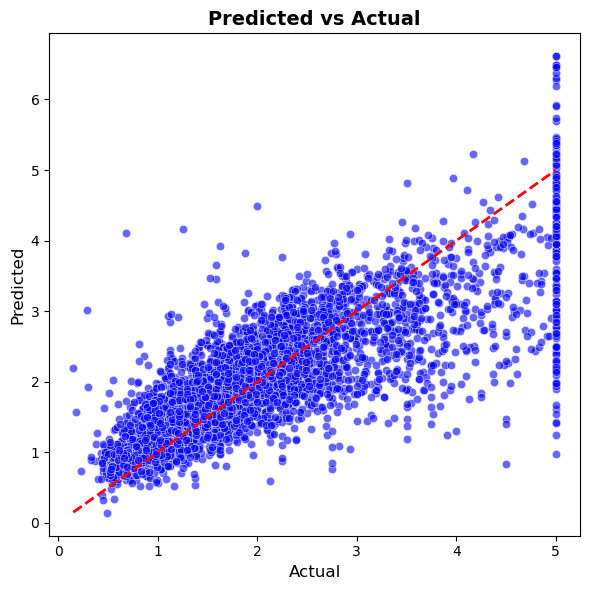


Epoch    45
Train_cost  = 0.4790 | Test_cost  = 0.4867 | Train_score = 0.6417 | Test_score = 0.6286 |


─────────────────────────────────────────────────── 🚀 EPOCH 46 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2287.18it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4782 │ 0.4912 │
│ MAE    │ 0.4953 │ 0.4835 │
│ RMSE   │ 0.6915 │ 0.7008 │
│ R2     │ 0.6423 │ 0.6252 │
└────────┴────────┴────────┘

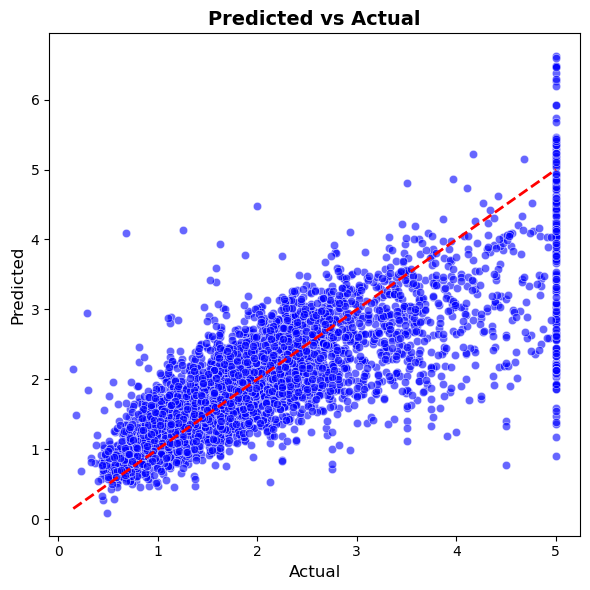


Epoch    46
Train_cost  = 0.4782 | Test_cost  = 0.4912 | Train_score = 0.6423 | Test_score = 0.6252 |
==> EarlyStop patience =  1 | Best test_score: 0.6286


─────────────────────────────────────────────────── 🚀 EPOCH 47 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2276.80it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4775 │ 0.4852 │
│ MAE    │ 0.4937 │ 0.4941 │
│ RMSE   │ 0.6910 │ 0.6966 │
│ R2     │ 0.6428 │ 0.6297 │
└────────┴────────┴────────┘

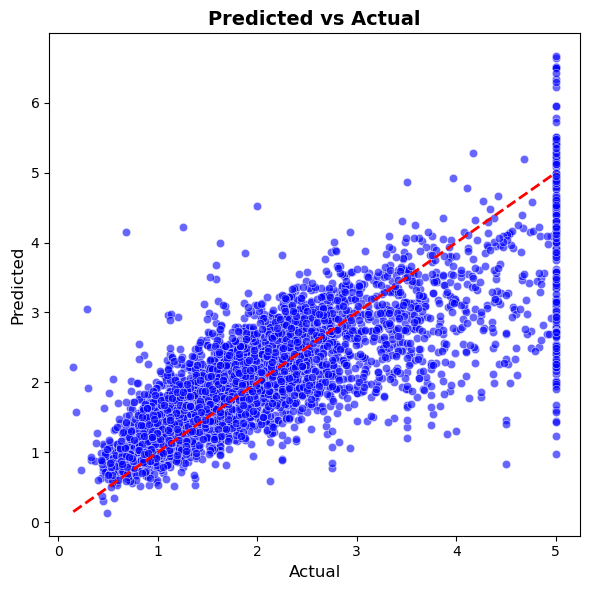


Epoch    47
Train_cost  = 0.4775 | Test_cost  = 0.4852 | Train_score = 0.6428 | Test_score = 0.6297 |


─────────────────────────────────────────────────── 🚀 EPOCH 48 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2297.21it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4769 │ 0.4838 │
│ MAE    │ 0.4930 │ 0.4942 │
│ RMSE   │ 0.6906 │ 0.6955 │
│ R2     │ 0.6432 │ 0.6308 │
└────────┴────────┴────────┘

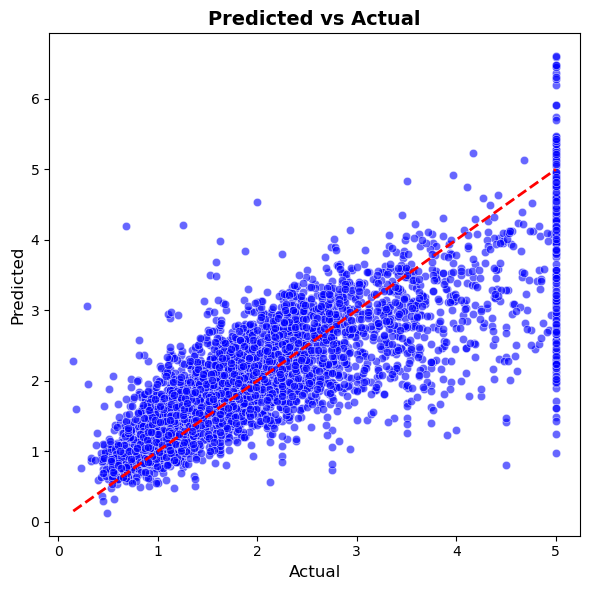


Epoch    48
Train_cost  = 0.4769 | Test_cost  = 0.4838 | Train_score = 0.6432 | Test_score = 0.6308 |


─────────────────────────────────────────────────── 🚀 EPOCH 49 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2742.68it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4770 │ 0.4854 │
│ MAE    │ 0.4941 │ 0.4968 │
│ RMSE   │ 0.6907 │ 0.6967 │
│ R2     │ 0.6431 │ 0.6296 │
└────────┴────────┴────────┘

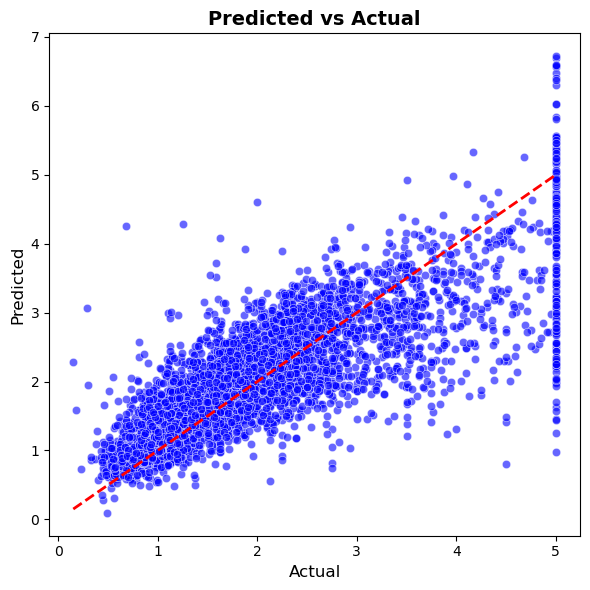


Epoch    49
Train_cost  = 0.4770 | Test_cost  = 0.4854 | Train_score = 0.6431 | Test_score = 0.6296 |
==> EarlyStop patience =  1 | Best test_score: 0.6308


─────────────────────────────────────────────────── 🚀 EPOCH 50 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2665.82it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4763 │ 0.4841 │
│ MAE    │ 0.4928 │ 0.4872 │
│ RMSE   │ 0.6901 │ 0.6958 │
│ R2     │ 0.6437 │ 0.6306 │
└────────┴────────┴────────┘

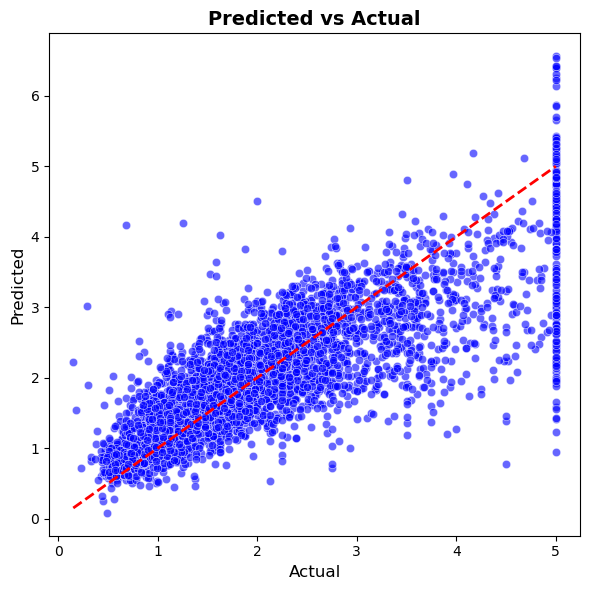


Epoch    50
Train_cost  = 0.4763 | Test_cost  = 0.4841 | Train_score = 0.6437 | Test_score = 0.6306 |
==> EarlyStop patience =  2 | Best test_score: 0.6308


─────────────────────────────────────────────────── 🚀 EPOCH 51 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2876.42it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4755 │ 0.4834 │
│ MAE    │ 0.4926 │ 0.4945 │
│ RMSE   │ 0.6895 │ 0.6953 │
│ R2     │ 0.6443 │ 0.6311 │
└────────┴────────┴────────┘

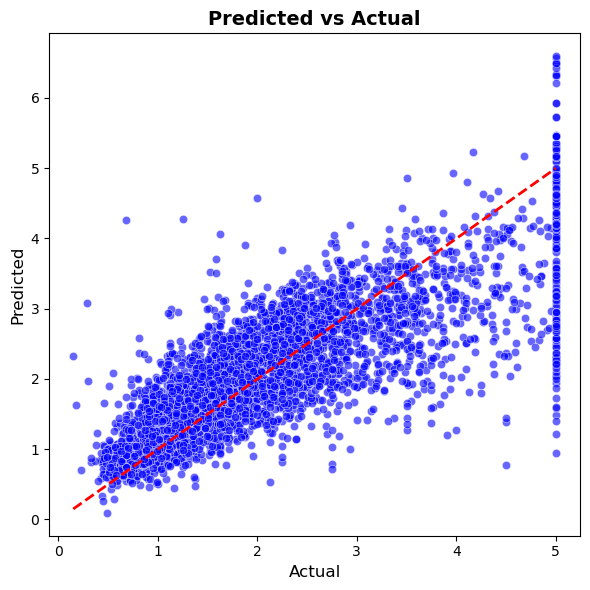


Epoch    51
Train_cost  = 0.4755 | Test_cost  = 0.4834 | Train_score = 0.6443 | Test_score = 0.6311 |


─────────────────────────────────────────────────── 🚀 EPOCH 52 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2751.89it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4736 │ 0.4835 │
│ MAE    │ 0.4913 │ 0.4888 │
│ RMSE   │ 0.6882 │ 0.6953 │
│ R2     │ 0.6457 │ 0.6311 │
└────────┴────────┴────────┘

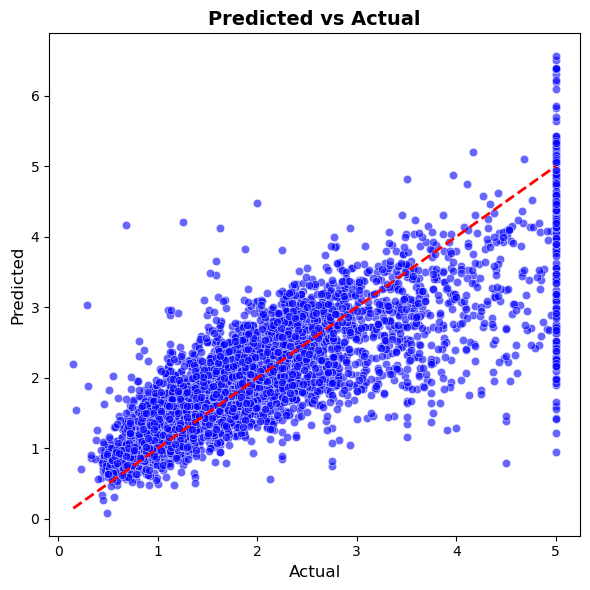


Epoch    52
Train_cost  = 0.4736 | Test_cost  = 0.4835 | Train_score = 0.6457 | Test_score = 0.6311 |
==> EarlyStop patience =  1 | Best test_score: 0.6311


─────────────────────────────────────────────────── 🚀 EPOCH 53 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2877.47it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4757 │ 0.4849 │
│ MAE    │ 0.4927 │ 0.5004 │
│ RMSE   │ 0.6897 │ 0.6963 │
│ R2     │ 0.6442 │ 0.6300 │
└────────┴────────┴────────┘

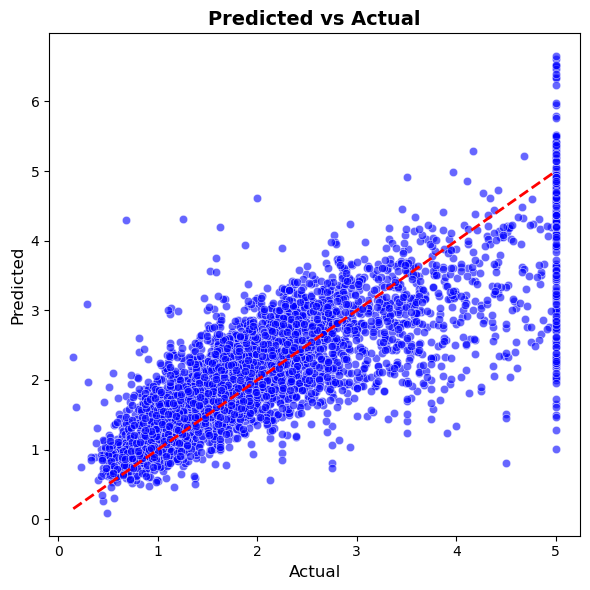


Epoch    53
Train_cost  = 0.4757 | Test_cost  = 0.4849 | Train_score = 0.6442 | Test_score = 0.6300 |
==> EarlyStop patience =  2 | Best test_score: 0.6311


─────────────────────────────────────────────────── 🚀 EPOCH 54 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2787.73it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4738 │ 0.4866 │
│ MAE    │ 0.4913 │ 0.4811 │
│ RMSE   │ 0.6883 │ 0.6975 │
│ R2     │ 0.6456 │ 0.6287 │
└────────┴────────┴────────┘

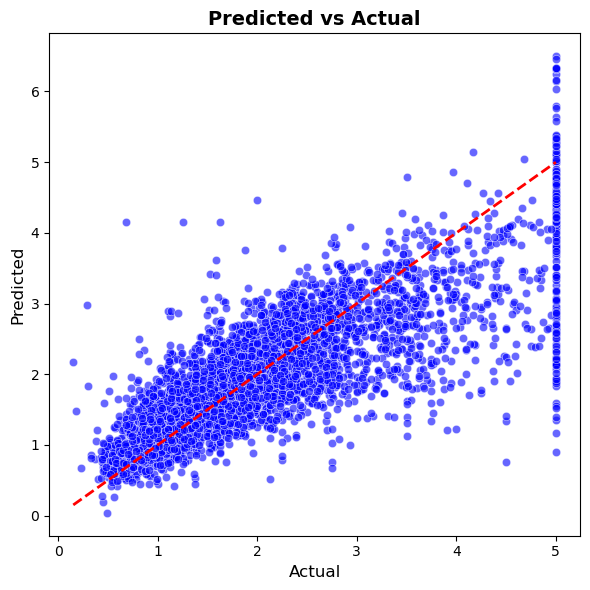


Epoch    54
Train_cost  = 0.4738 | Test_cost  = 0.4866 | Train_score = 0.6456 | Test_score = 0.6287 |
==> EarlyStop patience =  3 | Best test_score: 0.6311


─────────────────────────────────────────────────── 🚀 EPOCH 55 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2626.01it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4732 │ 0.4823 │
│ MAE    │ 0.4921 │ 0.4933 │
│ RMSE   │ 0.6879 │ 0.6945 │
│ R2     │ 0.6460 │ 0.6319 │
└────────┴────────┴────────┘

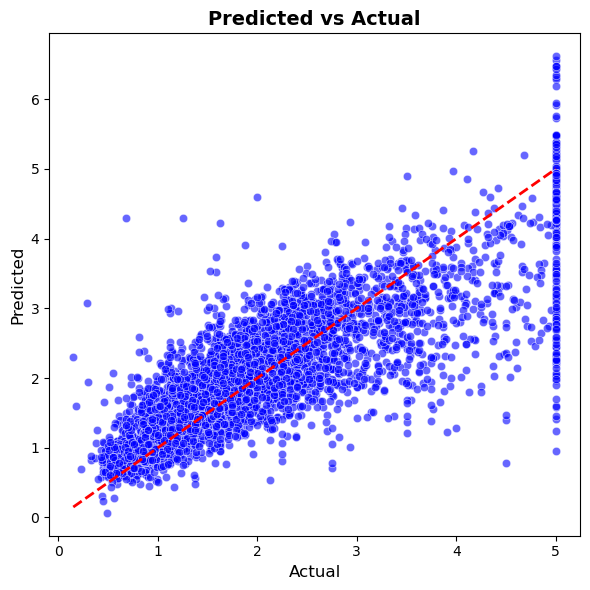


Epoch    55
Train_cost  = 0.4732 | Test_cost  = 0.4823 | Train_score = 0.6460 | Test_score = 0.6319 |


─────────────────────────────────────────────────── 🚀 EPOCH 56 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2781.27it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4727 │ 0.4816 │
│ MAE    │ 0.4917 │ 0.4869 │
│ RMSE   │ 0.6875 │ 0.6940 │
│ R2     │ 0.6464 │ 0.6325 │
└────────┴────────┴────────┘

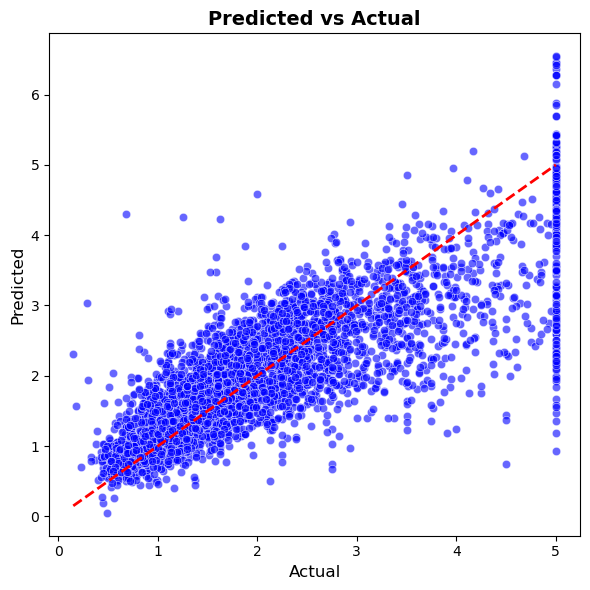


Epoch    56
Train_cost  = 0.4727 | Test_cost  = 0.4816 | Train_score = 0.6464 | Test_score = 0.6325 |


─────────────────────────────────────────────────── 🚀 EPOCH 57 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2502.66it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4732 │ 0.4812 │
│ MAE    │ 0.4911 │ 0.4883 │
│ RMSE   │ 0.6879 │ 0.6937 │
│ R2     │ 0.6460 │ 0.6327 │
└────────┴────────┴────────┘

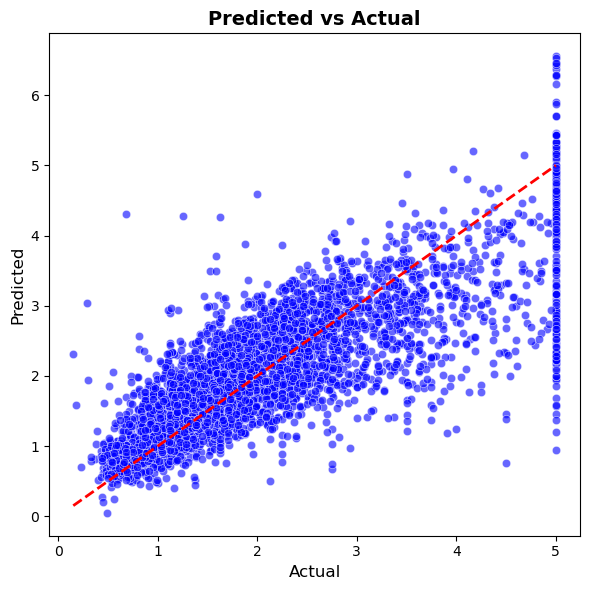


Epoch    57
Train_cost  = 0.4732 | Test_cost  = 0.4812 | Train_score = 0.6460 | Test_score = 0.6327 |


─────────────────────────────────────────────────── 🚀 EPOCH 58 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 1941.41it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4729 │ 0.4804 │
│ MAE    │ 0.4911 │ 0.4902 │
│ RMSE   │ 0.6877 │ 0.6931 │
│ R2     │ 0.6462 │ 0.6334 │
└────────┴────────┴────────┘

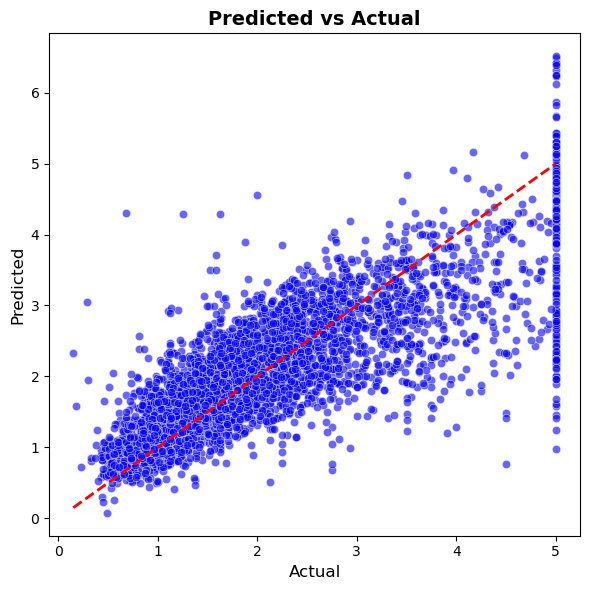


Epoch    58
Train_cost  = 0.4729 | Test_cost  = 0.4804 | Train_score = 0.6462 | Test_score = 0.6334 |


─────────────────────────────────────────────────── 🚀 EPOCH 59 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2319.56it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4722 │ 0.4803 │
│ MAE    │ 0.4908 │ 0.4909 │
│ RMSE   │ 0.6872 │ 0.6930 │
│ R2     │ 0.6467 │ 0.6335 │
└────────┴────────┴────────┘

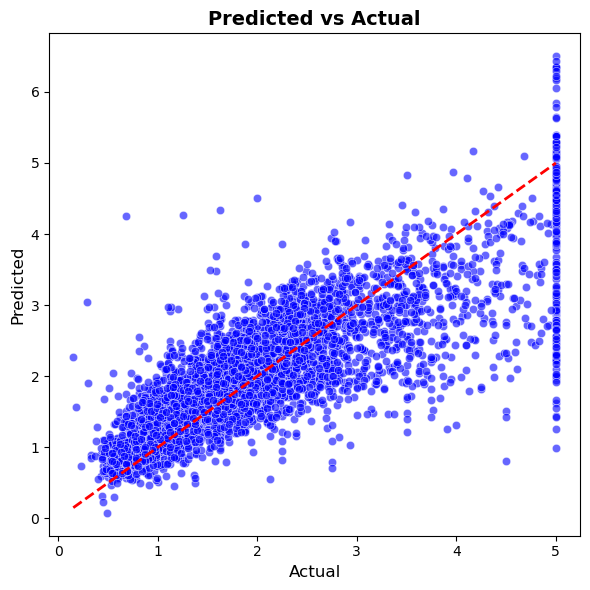


Epoch    59
Train_cost  = 0.4722 | Test_cost  = 0.4803 | Train_score = 0.6467 | Test_score = 0.6335 |


─────────────────────────────────────────────────── 🚀 EPOCH 60 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2565.79it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4719 │ 0.4819 │
│ MAE    │ 0.4907 │ 0.4826 │
│ RMSE   │ 0.6869 │ 0.6942 │
│ R2     │ 0.6470 │ 0.6323 │
└────────┴────────┴────────┘

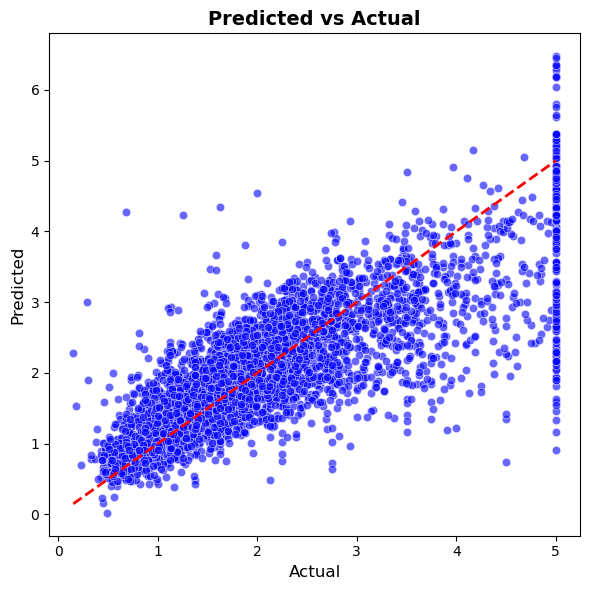


Epoch    60
Train_cost  = 0.4719 | Test_cost  = 0.4819 | Train_score = 0.6470 | Test_score = 0.6323 |


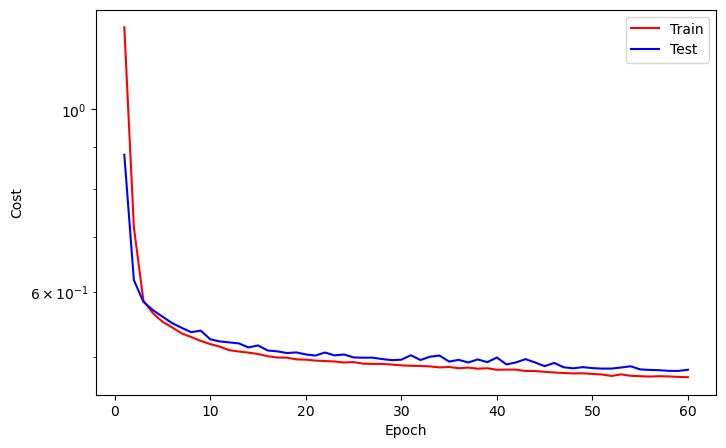

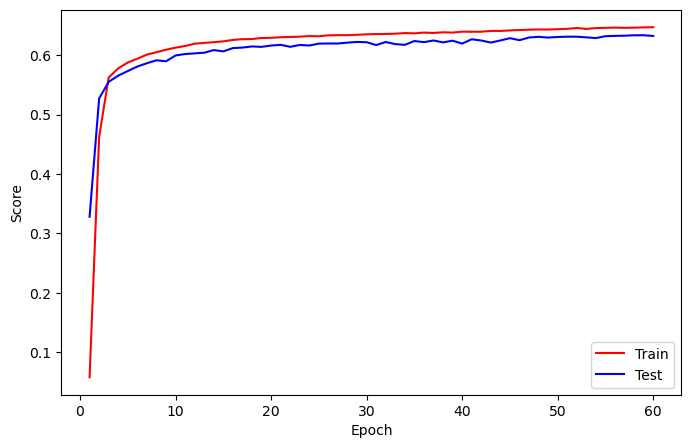

==> EarlyStop patience =  1 | Best test_score: 0.6335


─────────────────────────────────────────────────── 🚀 EPOCH 61 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 1631.77it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4709 │ 0.4808 │
│ MAE    │ 0.4901 │ 0.4839 │
│ RMSE   │ 0.6863 │ 0.6934 │
│ R2     │ 0.6477 │ 0.6331 │
└────────┴────────┴────────┘

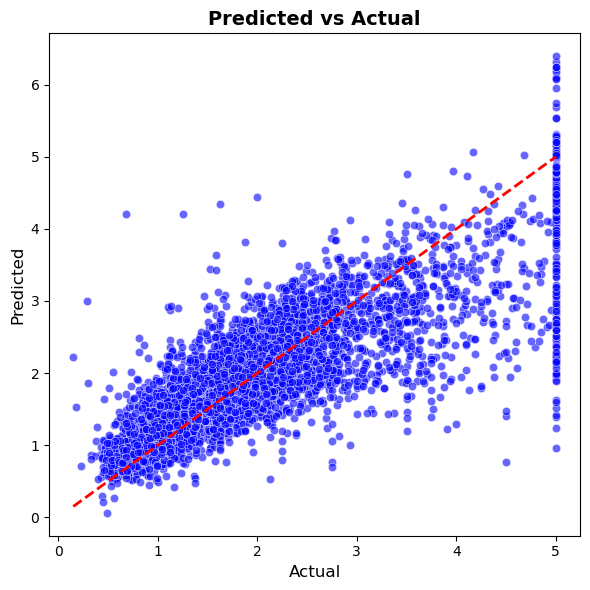


Epoch    61
Train_cost  = 0.4709 | Test_cost  = 0.4808 | Train_score = 0.6477 | Test_score = 0.6331 |
==> EarlyStop patience =  2 | Best test_score: 0.6335


─────────────────────────────────────────────────── 🚀 EPOCH 62 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2365.67it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4724 │ 0.4858 │
│ MAE    │ 0.4913 │ 0.4788 │
│ RMSE   │ 0.6873 │ 0.6970 │
│ R2     │ 0.6466 │ 0.6293 │
└────────┴────────┴────────┘

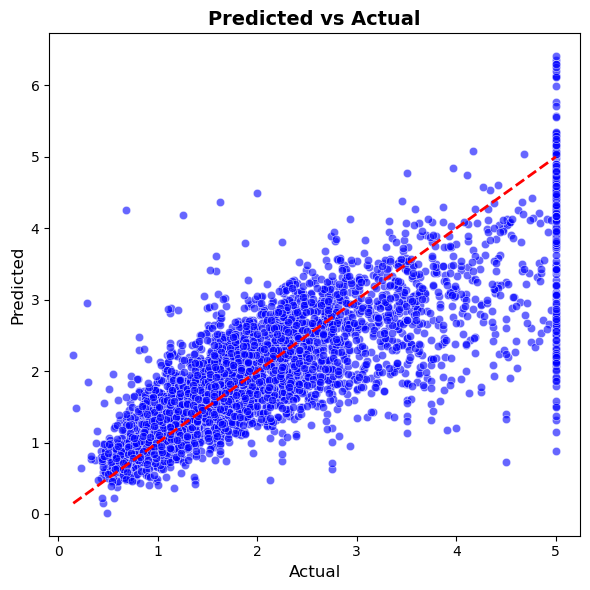


Epoch    62
Train_cost  = 0.4724 | Test_cost  = 0.4858 | Train_score = 0.6466 | Test_score = 0.6293 |
==> EarlyStop patience =  3 | Best test_score: 0.6335


─────────────────────────────────────────────────── 🚀 EPOCH 63 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2485.66it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4707 │ 0.4790 │
│ MAE    │ 0.4887 │ 0.4877 │
│ RMSE   │ 0.6861 │ 0.6921 │
│ R2     │ 0.6479 │ 0.6345 │
└────────┴────────┴────────┘

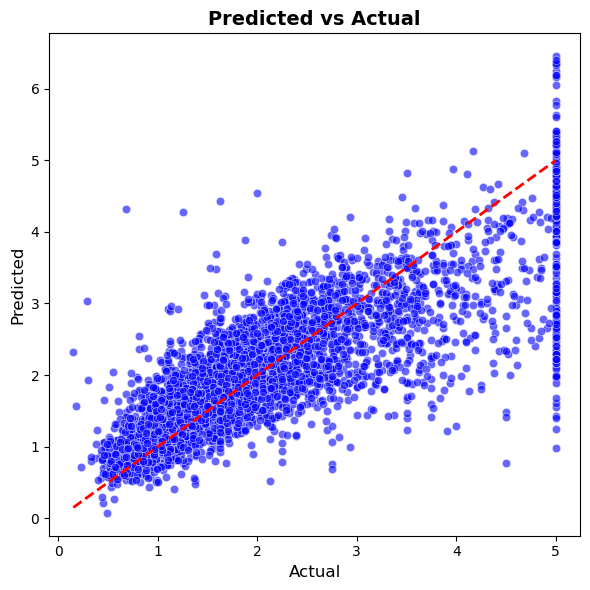


Epoch    63
Train_cost  = 0.4707 | Test_cost  = 0.4790 | Train_score = 0.6479 | Test_score = 0.6345 |


─────────────────────────────────────────────────── 🚀 EPOCH 64 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 1941.47it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4719 │ 0.4885 │
│ MAE    │ 0.4906 │ 0.4775 │
│ RMSE   │ 0.6870 │ 0.6989 │
│ R2     │ 0.6470 │ 0.6272 │
└────────┴────────┴────────┘

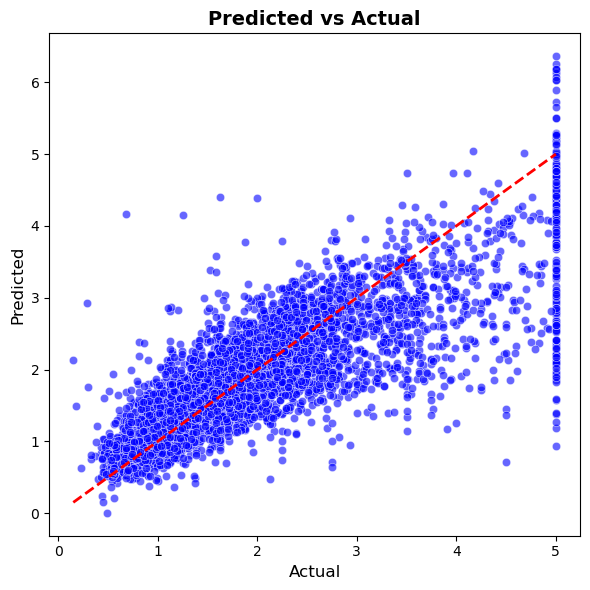


Epoch    64
Train_cost  = 0.4719 | Test_cost  = 0.4885 | Train_score = 0.6470 | Test_score = 0.6272 |
==> EarlyStop patience =  1 | Best test_score: 0.6345


─────────────────────────────────────────────────── 🚀 EPOCH 65 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2214.79it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4704 │ 0.4848 │
│ MAE    │ 0.4892 │ 0.4790 │
│ RMSE   │ 0.6858 │ 0.6963 │
│ R2     │ 0.6481 │ 0.6300 │
└────────┴────────┴────────┘

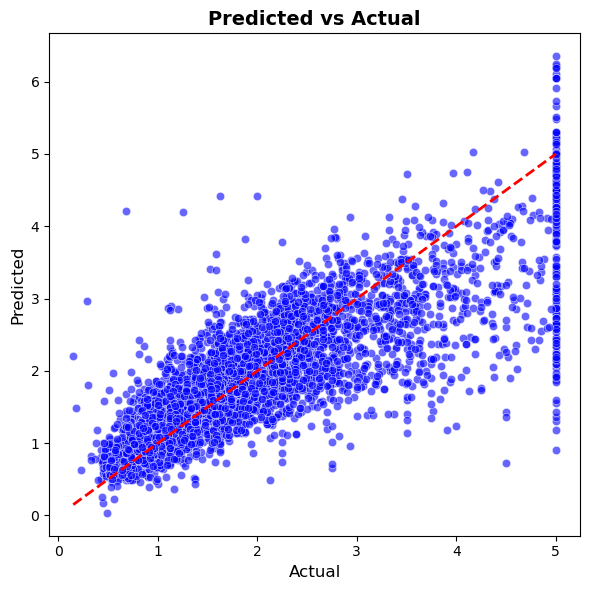


Epoch    65
Train_cost  = 0.4704 | Test_cost  = 0.4848 | Train_score = 0.6481 | Test_score = 0.6300 |
==> EarlyStop patience =  2 | Best test_score: 0.6345


─────────────────────────────────────────────────── 🚀 EPOCH 66 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2346.06it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4687 │ 0.4884 │
│ MAE    │ 0.4881 │ 0.4774 │
│ RMSE   │ 0.6846 │ 0.6989 │
│ R2     │ 0.6494 │ 0.6273 │
└────────┴────────┴────────┘

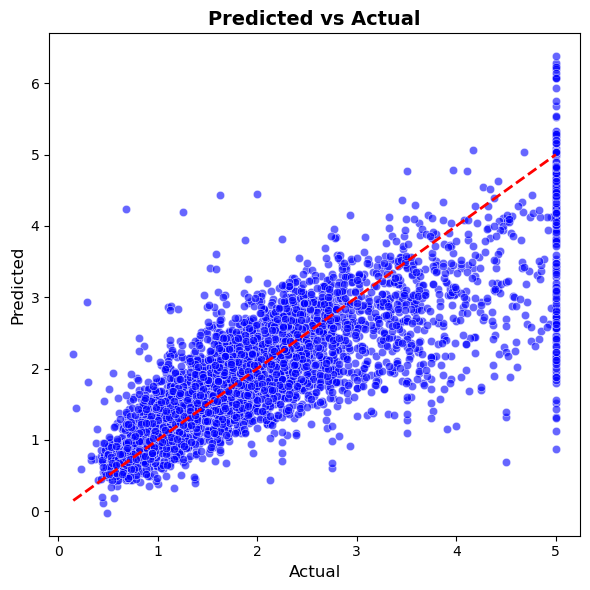


Epoch    66
Train_cost  = 0.4687 | Test_cost  = 0.4884 | Train_score = 0.6494 | Test_score = 0.6273 |
==> EarlyStop patience =  3 | Best test_score: 0.6345


─────────────────────────────────────────────────── 🚀 EPOCH 67 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2488.64it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4701 │ 0.4786 │
│ MAE    │ 0.4893 │ 0.4907 │
│ RMSE   │ 0.6856 │ 0.6918 │
│ R2     │ 0.6483 │ 0.6348 │
└────────┴────────┴────────┘

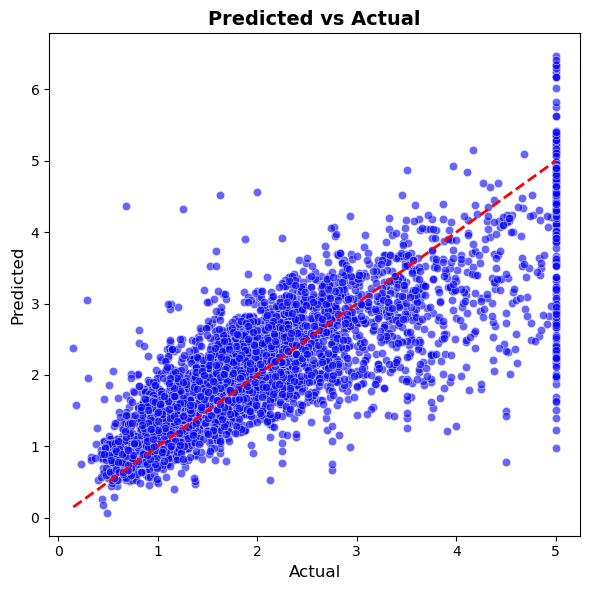


Epoch    67
Train_cost  = 0.4701 | Test_cost  = 0.4786 | Train_score = 0.6483 | Test_score = 0.6348 |


─────────────────────────────────────────────────── 🚀 EPOCH 68 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2565.00it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4694 │ 0.4884 │
│ MAE    │ 0.4885 │ 0.5103 │
│ RMSE   │ 0.6852 │ 0.6989 │
│ R2     │ 0.6488 │ 0.6273 │
└────────┴────────┴────────┘

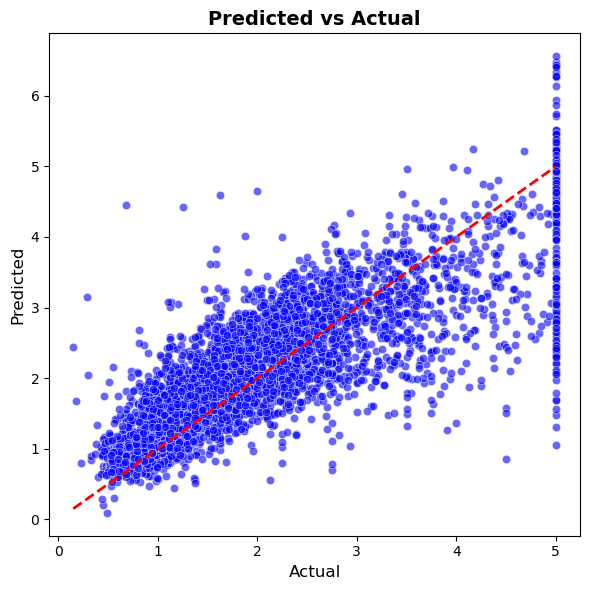


Epoch    68
Train_cost  = 0.4694 | Test_cost  = 0.4884 | Train_score = 0.6488 | Test_score = 0.6273 |
==> EarlyStop patience =  1 | Best test_score: 0.6348


─────────────────────────────────────────────────── 🚀 EPOCH 69 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2418.87it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4687 │ 0.4770 │
│ MAE    │ 0.4883 │ 0.4884 │
│ RMSE   │ 0.6846 │ 0.6906 │
│ R2     │ 0.6494 │ 0.6360 │
└────────┴────────┴────────┘

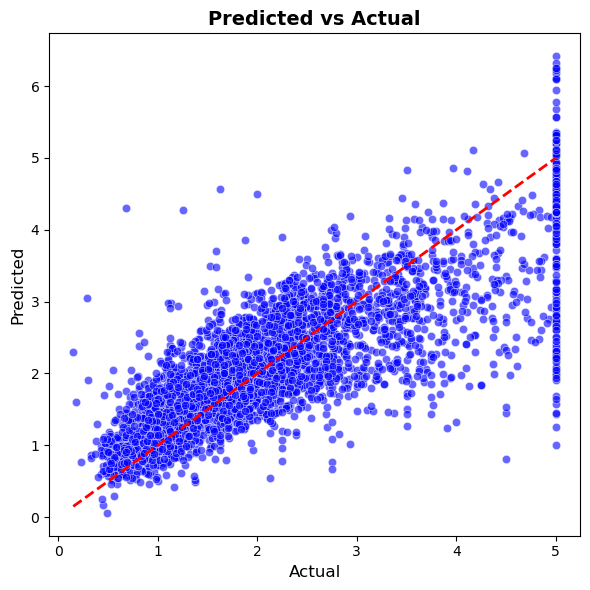


Epoch    69
Train_cost  = 0.4687 | Test_cost  = 0.4770 | Train_score = 0.6494 | Test_score = 0.6360 |


─────────────────────────────────────────────────── 🚀 EPOCH 70 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2481.59it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4689 │ 0.4933 │
│ MAE    │ 0.4890 │ 0.4760 │
│ RMSE   │ 0.6848 │ 0.7024 │
│ R2     │ 0.6492 │ 0.6236 │
└────────┴────────┴────────┘

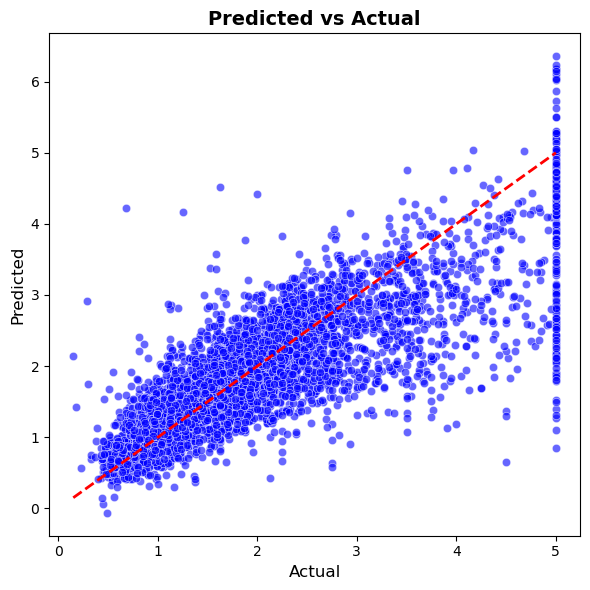


Epoch    70
Train_cost  = 0.4689 | Test_cost  = 0.4933 | Train_score = 0.6492 | Test_score = 0.6236 |
==> EarlyStop patience =  1 | Best test_score: 0.6360


─────────────────────────────────────────────────── 🚀 EPOCH 71 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2498.08it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4682 │ 0.5128 │
│ MAE    │ 0.4882 │ 0.4782 │
│ RMSE   │ 0.6843 │ 0.7161 │
│ R2     │ 0.6497 │ 0.6087 │
└────────┴────────┴────────┘

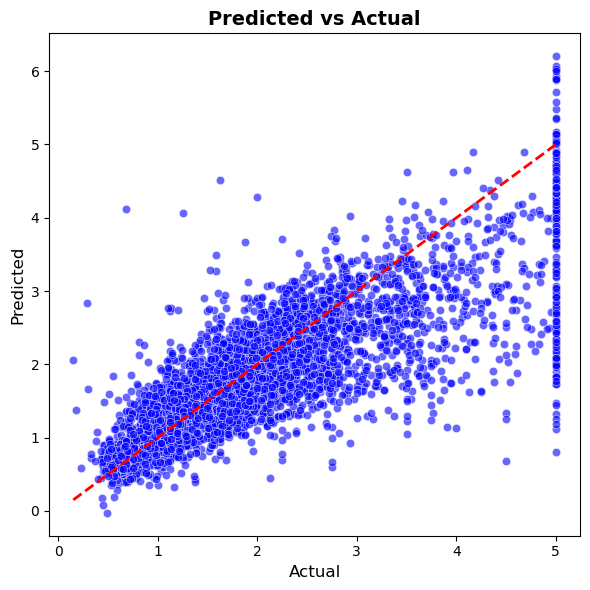


Epoch    71
Train_cost  = 0.4682 | Test_cost  = 0.5128 | Train_score = 0.6497 | Test_score = 0.6087 |
==> EarlyStop patience =  2 | Best test_score: 0.6360


─────────────────────────────────────────────────── 🚀 EPOCH 72 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2432.83it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4693 │ 0.4772 │
│ MAE    │ 0.4881 │ 0.4832 │
│ RMSE   │ 0.6851 │ 0.6908 │
│ R2     │ 0.6489 │ 0.6358 │
└────────┴────────┴────────┘

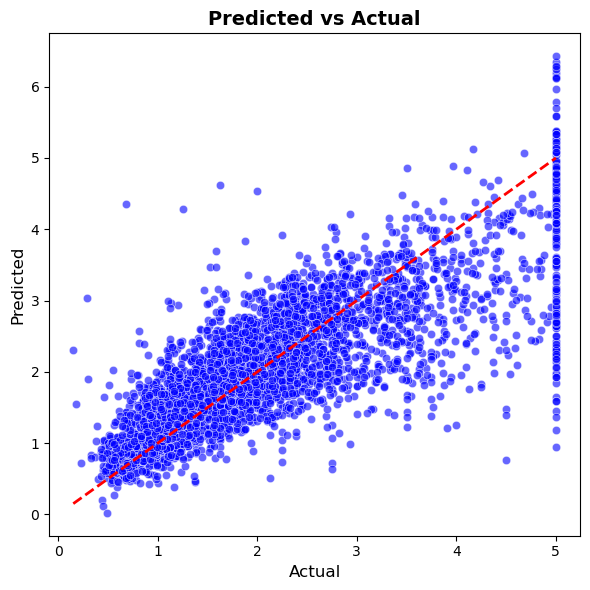


Epoch    72
Train_cost  = 0.4693 | Test_cost  = 0.4772 | Train_score = 0.6489 | Test_score = 0.6358 |
==> EarlyStop patience =  3 | Best test_score: 0.6360


─────────────────────────────────────────────────── 🚀 EPOCH 73 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2610.35it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4682 │ 0.4765 │
│ MAE    │ 0.4882 │ 0.4861 │
│ RMSE   │ 0.6843 │ 0.6903 │
│ R2     │ 0.6497 │ 0.6364 │
└────────┴────────┴────────┘

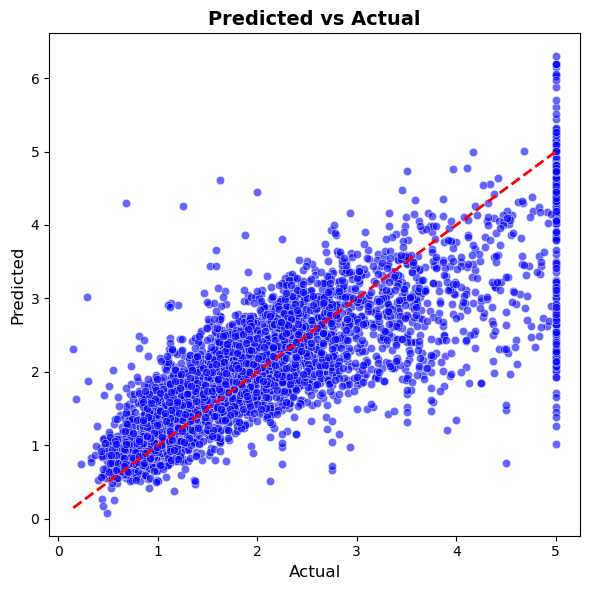


Epoch    73
Train_cost  = 0.4682 | Test_cost  = 0.4765 | Train_score = 0.6497 | Test_score = 0.6364 |


─────────────────────────────────────────────────── 🚀 EPOCH 74 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2504.53it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4673 │ 0.4761 │
│ MAE    │ 0.4883 │ 0.4823 │
│ RMSE   │ 0.6836 │ 0.6900 │
│ R2     │ 0.6504 │ 0.6367 │
└────────┴────────┴────────┘

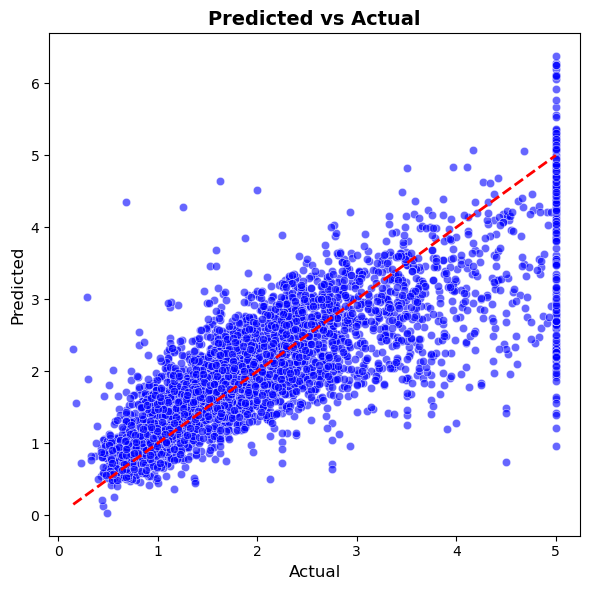


Epoch    74
Train_cost  = 0.4673 | Test_cost  = 0.4761 | Train_score = 0.6504 | Test_score = 0.6367 |


─────────────────────────────────────────────────── 🚀 EPOCH 75 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2196.77it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4669 │ 0.4754 │
│ MAE    │ 0.4872 │ 0.4831 │
│ RMSE   │ 0.6833 │ 0.6895 │
│ R2     │ 0.6507 │ 0.6372 │
└────────┴────────┴────────┘

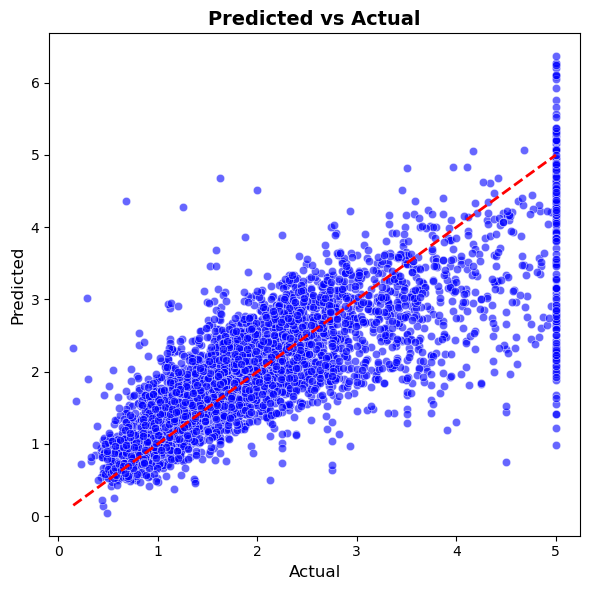


Epoch    75
Train_cost  = 0.4669 | Test_cost  = 0.4754 | Train_score = 0.6507 | Test_score = 0.6372 |


─────────────────────────────────────────────────── 🚀 EPOCH 76 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2619.50it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4664 │ 0.4756 │
│ MAE    │ 0.4865 │ 0.4819 │
│ RMSE   │ 0.6829 │ 0.6896 │
│ R2     │ 0.6511 │ 0.6371 │
└────────┴────────┴────────┘

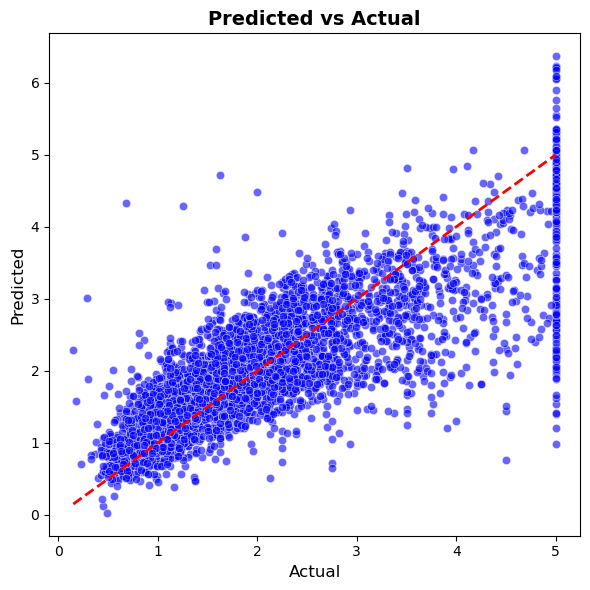


Epoch    76
Train_cost  = 0.4664 | Test_cost  = 0.4756 | Train_score = 0.6511 | Test_score = 0.6371 |
==> EarlyStop patience =  1 | Best test_score: 0.6372


─────────────────────────────────────────────────── 🚀 EPOCH 77 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2062.16it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4664 │ 0.4836 │
│ MAE    │ 0.4870 │ 0.5095 │
│ RMSE   │ 0.6830 │ 0.6954 │
│ R2     │ 0.6511 │ 0.6309 │
└────────┴────────┴────────┘

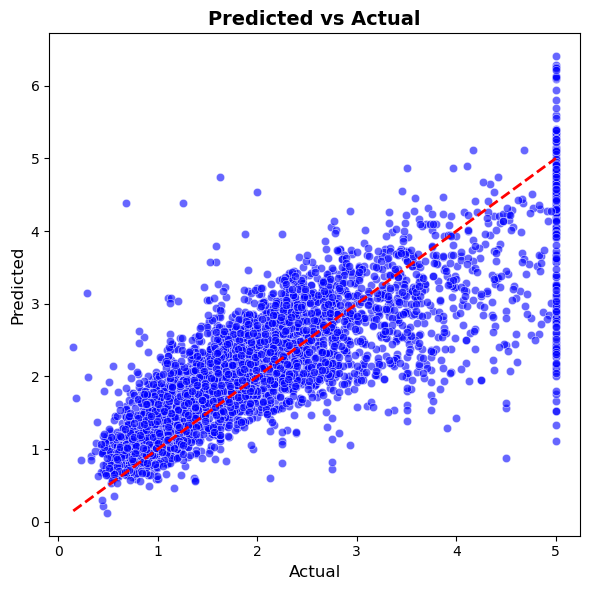


Epoch    77
Train_cost  = 0.4664 | Test_cost  = 0.4836 | Train_score = 0.6511 | Test_score = 0.6309 |
==> EarlyStop patience =  2 | Best test_score: 0.6372


─────────────────────────────────────────────────── 🚀 EPOCH 78 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2572.12it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4663 │ 0.4757 │
│ MAE    │ 0.4866 │ 0.4885 │
│ RMSE   │ 0.6829 │ 0.6897 │
│ R2     │ 0.6512 │ 0.6370 │
└────────┴────────┴────────┘

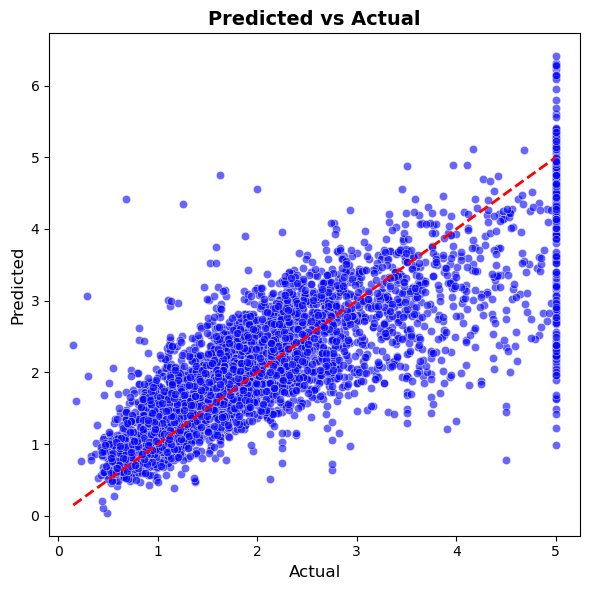


Epoch    78
Train_cost  = 0.4663 | Test_cost  = 0.4757 | Train_score = 0.6512 | Test_score = 0.6370 |
==> EarlyStop patience =  3 | Best test_score: 0.6372


─────────────────────────────────────────────────── 🚀 EPOCH 79 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2542.37it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4666 │ 0.4800 │
│ MAE    │ 0.4879 │ 0.5023 │
│ RMSE   │ 0.6830 │ 0.6928 │
│ R2     │ 0.6510 │ 0.6337 │
└────────┴────────┴────────┘

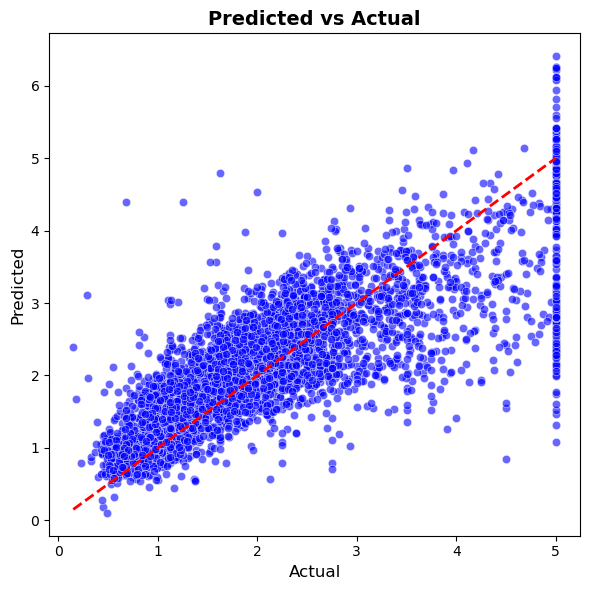


Epoch    79
Train_cost  = 0.4666 | Test_cost  = 0.4800 | Train_score = 0.6510 | Test_score = 0.6337 |
==> EarlyStop patience =  4 | Best test_score: 0.6372


─────────────────────────────────────────────────── 🚀 EPOCH 80 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2082.76it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4671 │ 0.4792 │
│ MAE    │ 0.4871 │ 0.5008 │
│ RMSE   │ 0.6834 │ 0.6922 │
│ R2     │ 0.6506 │ 0.6343 │
└────────┴────────┴────────┘

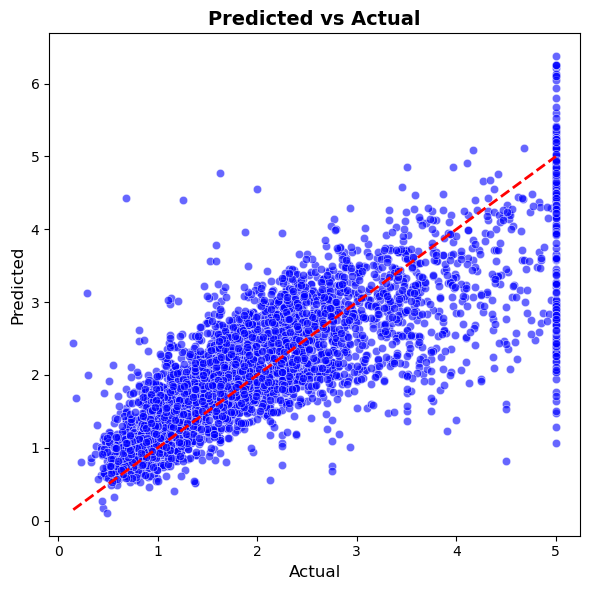


Epoch    80
Train_cost  = 0.4671 | Test_cost  = 0.4792 | Train_score = 0.6506 | Test_score = 0.6343 |


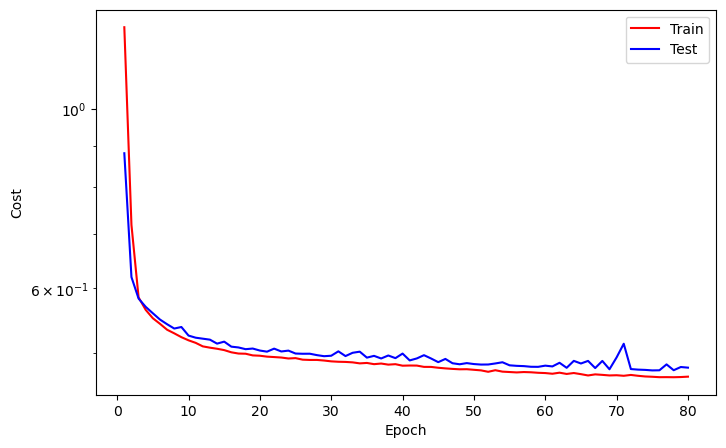

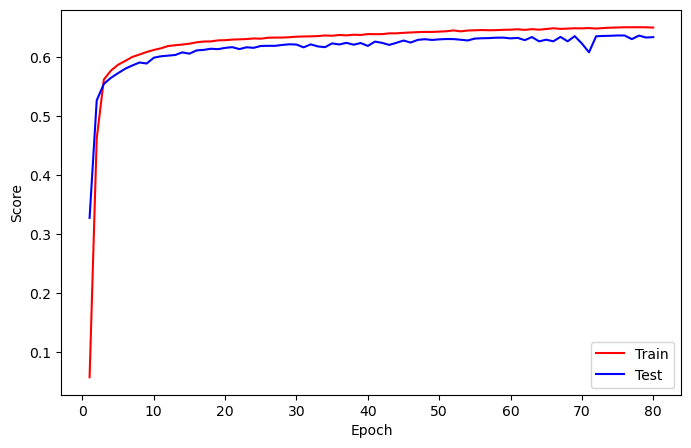

==> EarlyStop patience =  5 | Best test_score: 0.6372


─────────────────────────────────────────────────── 🚀 EPOCH 81 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2521.72it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4659 │ 0.4749 │
│ MAE    │ 0.4871 │ 0.4875 │
│ RMSE   │ 0.6826 │ 0.6892 │
│ R2     │ 0.6515 │ 0.6376 │
└────────┴────────┴────────┘

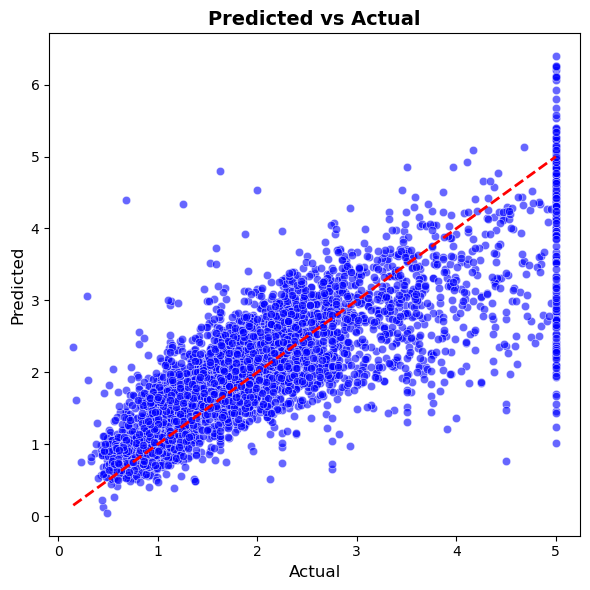


Epoch    81
Train_cost  = 0.4659 | Test_cost  = 0.4749 | Train_score = 0.6515 | Test_score = 0.6376 |


─────────────────────────────────────────────────── 🚀 EPOCH 82 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2548.24it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4655 │ 0.4740 │
│ MAE    │ 0.4859 │ 0.4879 │
│ RMSE   │ 0.6823 │ 0.6885 │
│ R2     │ 0.6518 │ 0.6383 │
└────────┴────────┴────────┘

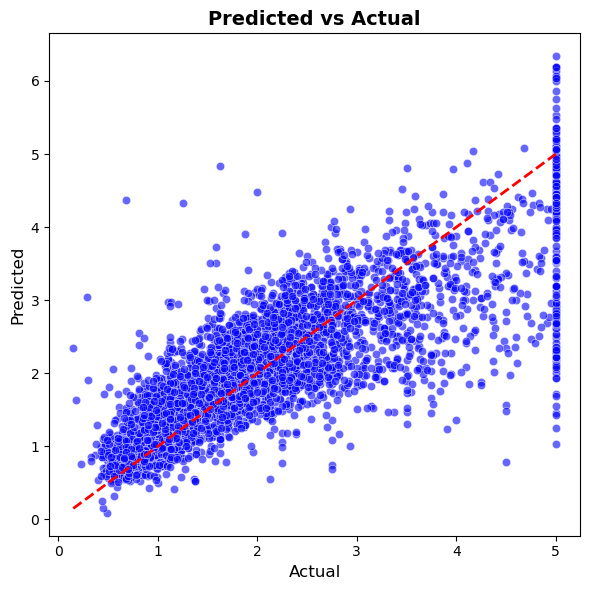


Epoch    82
Train_cost  = 0.4655 | Test_cost  = 0.4740 | Train_score = 0.6518 | Test_score = 0.6383 |


─────────────────────────────────────────────────── 🚀 EPOCH 83 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2640.91it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4650 │ 0.4813 │
│ MAE    │ 0.4858 │ 0.4749 │
│ RMSE   │ 0.6819 │ 0.6937 │
│ R2     │ 0.6522 │ 0.6327 │
└────────┴────────┴────────┘

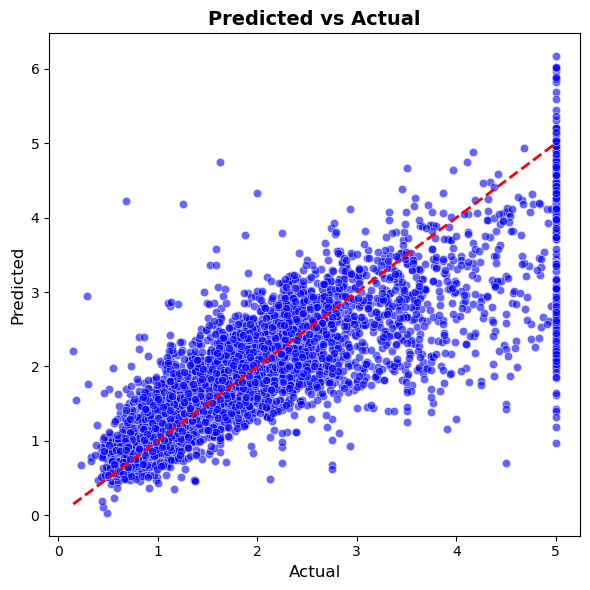


Epoch    83
Train_cost  = 0.4650 | Test_cost  = 0.4813 | Train_score = 0.6522 | Test_score = 0.6327 |
==> EarlyStop patience =  1 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 84 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2590.71it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4653 │ 0.4759 │
│ MAE    │ 0.4867 │ 0.4789 │
│ RMSE   │ 0.6821 │ 0.6899 │
│ R2     │ 0.6519 │ 0.6368 │
└────────┴────────┴────────┘

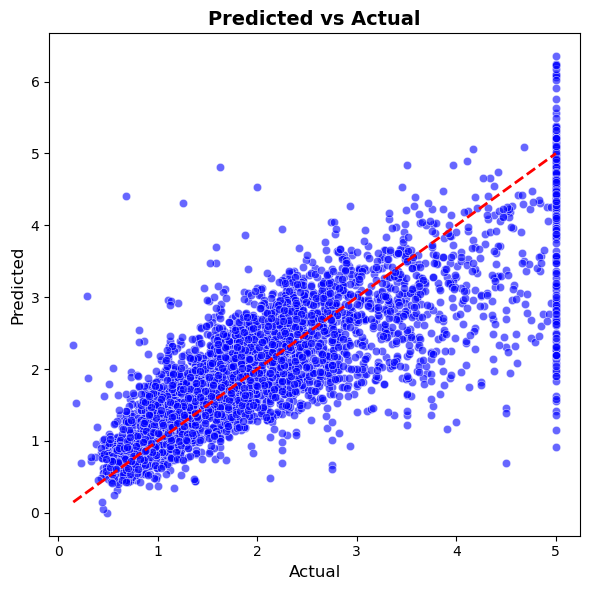


Epoch    84
Train_cost  = 0.4653 | Test_cost  = 0.4759 | Train_score = 0.6519 | Test_score = 0.6368 |
==> EarlyStop patience =  2 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 85 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2454.62it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4640 │ 0.4821 │
│ MAE    │ 0.4855 │ 0.4752 │
│ RMSE   │ 0.6812 │ 0.6943 │
│ R2     │ 0.6529 │ 0.6321 │
└────────┴────────┴────────┘

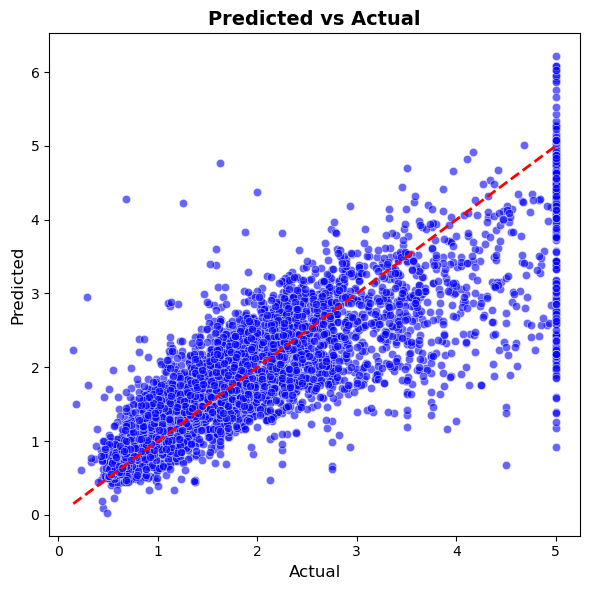


Epoch    85
Train_cost  = 0.4640 | Test_cost  = 0.4821 | Train_score = 0.6529 | Test_score = 0.6321 |
==> EarlyStop patience =  3 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 86 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2241.70it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4644 │ 0.4792 │
│ MAE    │ 0.4861 │ 0.4744 │
│ RMSE   │ 0.6815 │ 0.6922 │
│ R2     │ 0.6526 │ 0.6343 │
└────────┴────────┴────────┘

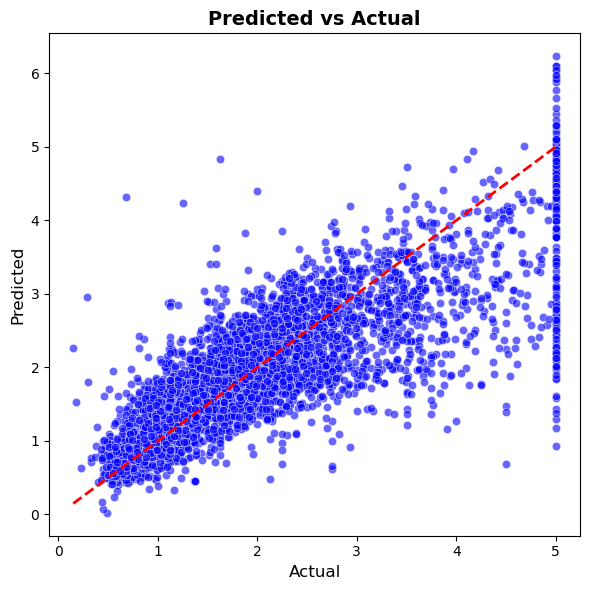


Epoch    86
Train_cost  = 0.4644 | Test_cost  = 0.4792 | Train_score = 0.6526 | Test_score = 0.6343 |
==> EarlyStop patience =  4 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 87 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2257.86it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4630 │ 0.4749 │
│ MAE    │ 0.4850 │ 0.4825 │
│ RMSE   │ 0.6804 │ 0.6891 │
│ R2     │ 0.6536 │ 0.6376 │
└────────┴────────┴────────┘

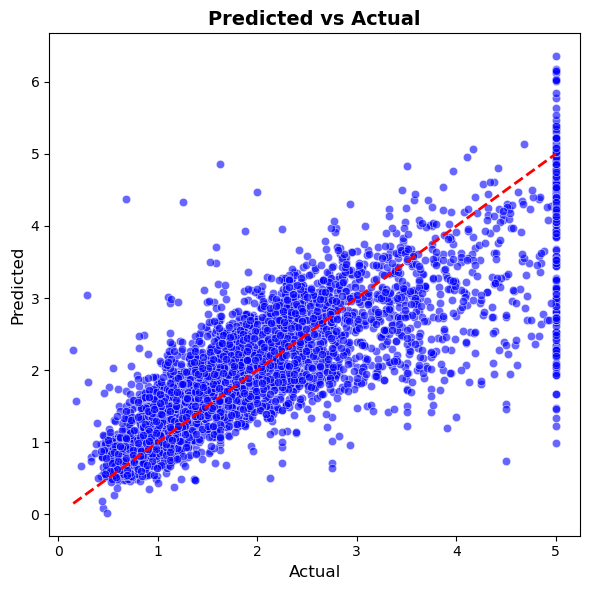


Epoch    87
Train_cost  = 0.4630 | Test_cost  = 0.4749 | Train_score = 0.6536 | Test_score = 0.6376 |
==> EarlyStop patience =  5 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 88 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2112.36it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4641 │ 0.4765 │
│ MAE    │ 0.4852 │ 0.4974 │
│ RMSE   │ 0.6812 │ 0.6903 │
│ R2     │ 0.6529 │ 0.6364 │
└────────┴────────┴────────┘

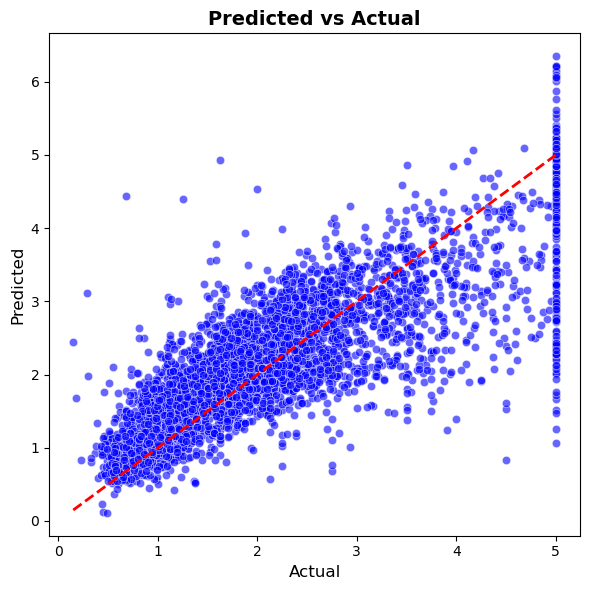


Epoch    88
Train_cost  = 0.4641 | Test_cost  = 0.4765 | Train_score = 0.6529 | Test_score = 0.6364 |
==> EarlyStop patience =  6 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 89 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2318.46it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4641 │ 0.4821 │
│ MAE    │ 0.4854 │ 0.4723 │
│ RMSE   │ 0.6812 │ 0.6944 │
│ R2     │ 0.6528 │ 0.6321 │
└────────┴────────┴────────┘

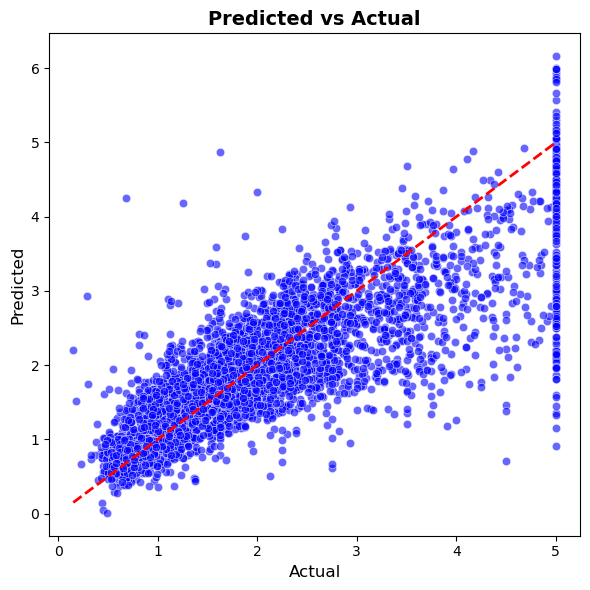


Epoch    89
Train_cost  = 0.4641 | Test_cost  = 0.4821 | Train_score = 0.6528 | Test_score = 0.6321 |
==> EarlyStop patience =  7 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 90 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2086.73it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4649 │ 0.4766 │
│ MAE    │ 0.4860 │ 0.4766 │
│ RMSE   │ 0.6818 │ 0.6904 │
│ R2     │ 0.6522 │ 0.6363 │
└────────┴────────┴────────┘

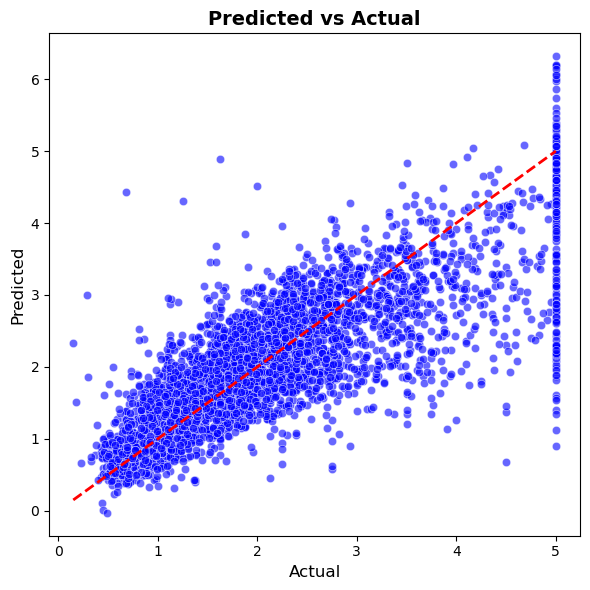


Epoch    90
Train_cost  = 0.4649 | Test_cost  = 0.4766 | Train_score = 0.6522 | Test_score = 0.6363 |
==> EarlyStop patience =  8 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 91 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2229.69it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4626 │ 0.4752 │
│ MAE    │ 0.4841 │ 0.4819 │
│ RMSE   │ 0.6801 │ 0.6894 │
│ R2     │ 0.6539 │ 0.6373 │
└────────┴────────┴────────┘

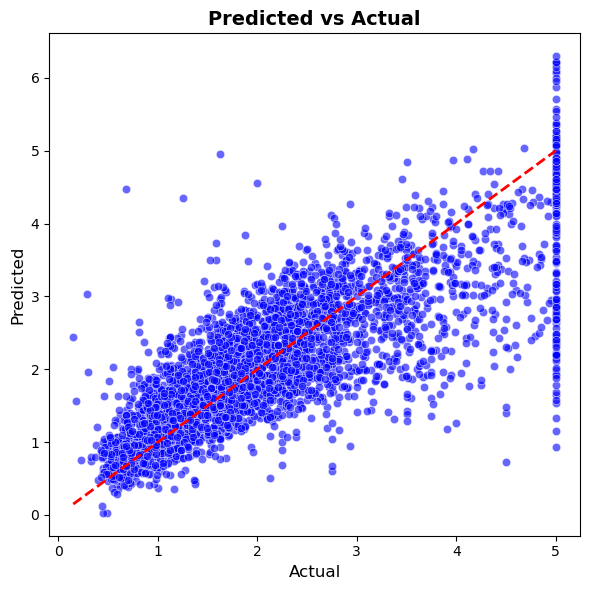


Epoch    91
Train_cost  = 0.4626 | Test_cost  = 0.4752 | Train_score = 0.6539 | Test_score = 0.6373 |
==> EarlyStop patience =  9 | Best test_score: 0.6383


─────────────────────────────────────────────────── 🚀 EPOCH 92 ───────────────────────────────────────────────────

test: 100%|██████████| 129/129 [00:00<00:00, 2497.98it/s]


    Summary (Regression)    
┏━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃ Metric ┃  Train ┃   Test ┃
┡━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ LOSS   │ 0.4634 │ 0.4833 │
│ MAE    │ 0.4851 │ 0.4720 │
│ RMSE   │ 0.6808 │ 0.6952 │
│ R2     │ 0.6533 │ 0.6312 │
└────────┴────────┴────────┘

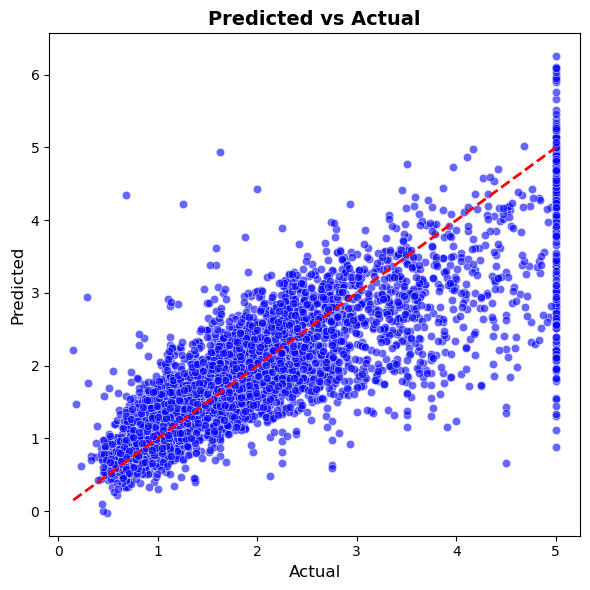


Epoch    92
Train_cost  = 0.4634 | Test_cost  = 0.4833 | Train_score = 0.6533 | Test_score = 0.6312 |
==> EarlyStop patience = 10 | Best test_score: 0.6383
==> Execute Early Stopping at epoch: 92 | Best test_score: 0.6383
==> Best model is saved at regresi/one-d/california_housing/


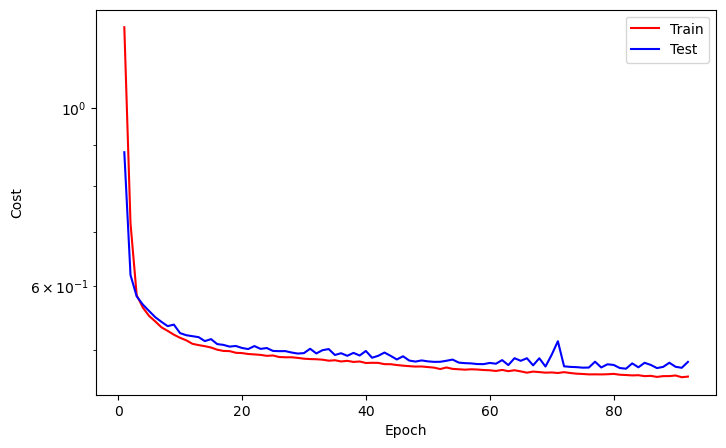

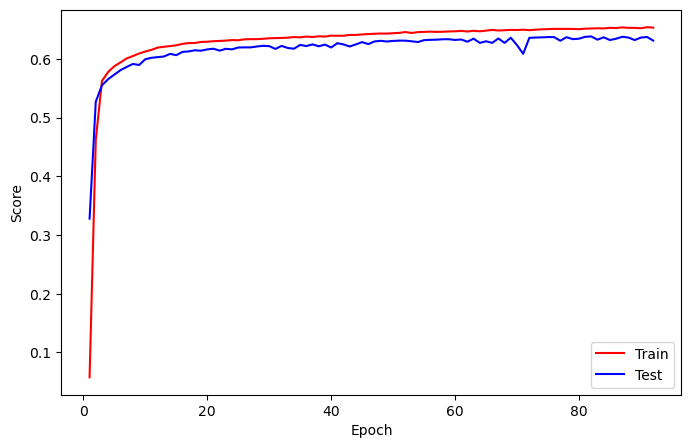

⏹️ Training dihentikan oleh early stopping.

In [12]:
from train_and_evaluate import train_and_evaluate_regression

train_and_evaluate_regression(
    model=model,
    train_dataset=train_dataset,
    test_dataset=test_dataset,
    train_loader=train_loader,
    test_loader=test_loader,
    criterion=criterion,
    optim=optim,
    config=config,
    device=device,        
    callback=callback,
    show_detail=True
)

# Evaluate

📊 Evaluasi Model Regresi 
┏━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃ Metrik        ┃  Nilai ┃
┡━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 💥 Loss (avg) │ 0.4740 │
│ 📉 MAE        │ 0.4879 │
│ 📉 MSE        │ 0.4740 │
│ 📉 RMSE       │ 0.6885 │
│ 📈 R² Score   │ 0.6383 │
└───────────────┴────────┘

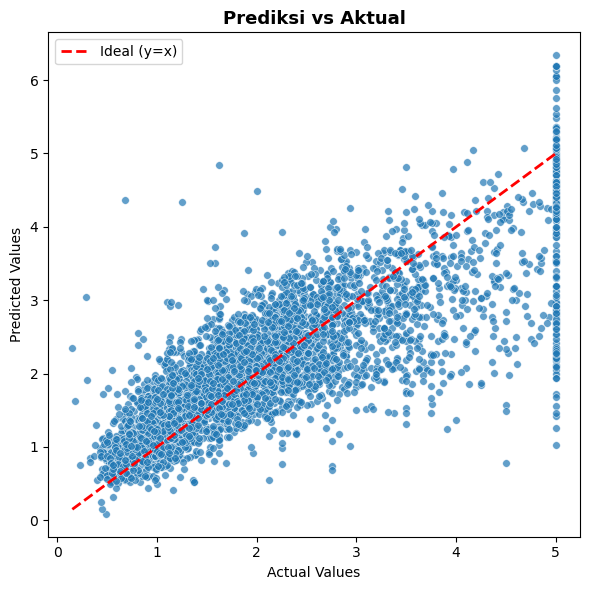

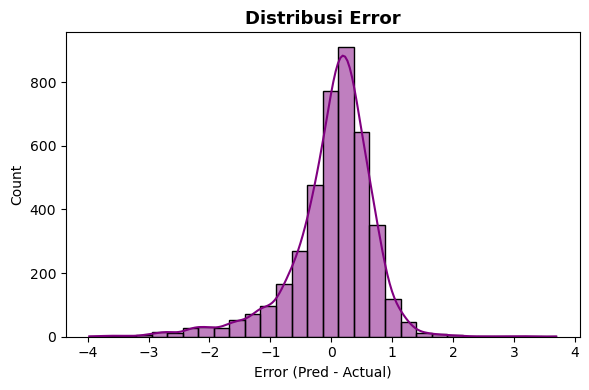

In [13]:
from evaluate import evaluate_regression

hsl = evaluate_regression(
    model=model,
    dataloader=test_loader,
    criterion=criterion,
    device=device,
    dimension='1d',
    
)

In [14]:
hsl['df'].head(200)

,Target,Prediksi,Error,Error (%)
0,1.790,1.9117,0.1217,6.800000
1,4.210,3.3571,-0.8529,-20.260000
2,0.960,0.9263,-0.0337,-3.510000
3,1.271,0.6941,-0.5769,-45.389999
4,2.068,2.6505,0.5825,28.170000
...,...,...,...,...
195,1.456,1.5628,0.1068,7.330000
196,2.407,2.5510,0.1440,5.980000
197,1.411,2.4757,1.0647,75.459999
198,3.627,3.2099,-0.4171,-11.500000


# Pengaplikasian

In [15]:
#!pip install ipywidgets
#!jupyter nbextension enable --py widgetsnbextension

In [16]:
import torch, json
from torch import optim, nn
from class_lib import Model1DPure
import joblib
import pandas as pd


# Load Config
try:
    config = torch.load(root_folder + "configs.pth", map_location="cpu", weights_only=False)
except:
    config = torch.load(root_folder + "configs.pth", map_location="cpu")

#Load Weights
weights= torch.load(root_folder + "weights_best.pth", map_location="cpu")


model = Model1DPure(input_dim=config.input_dim, hidden_dims=config.hidden_dims, output_dim=config.output_dim, dropout=config.dropout, activation=config.activation)
model.load_state_dict(weights)
model.eval() 

Model1DPure(
  (model): Sequential(
    (0): Linear(in_features=8, out_features=24, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.0, inplace=False)
    (3): Linear(in_features=24, out_features=1, bias=True)
  )
)

In [17]:
from aplokator import RegressionPredictor


predictor = RegressionPredictor(
    model=model,
    config=config,
    scaler_folder=root_folder,
)

HTML(value='\n        <style>\n        .minimal-container { background: #f8f9fa; padding: 12px; border-radius:…